In [1]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

print(tf.__version__)

1.13.0-rc2


In [11]:
#''' Run this only once
!pwd
!rm 17flowers.tgz
!wget http://www.robots.ox.ac.uk/~vgg/data/flowers/17/17flowers.tgz
!ls
!tar -xf 17flowers.tgz
!mkdir samples
!mv jpg samples
#'''
#!wget -O faces.tar.gz https://drive.google.com/file/d/0BxYys69jI14kYVM3aVhKS1VhRUk/view?usp=sharing
!ls -al
#!tar -xf faces.tar.gz 

/content
--2019-02-21 14:21:31--  http://www.robots.ox.ac.uk/~vgg/data/flowers/17/17flowers.tgz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 60270631 (57M) [application/x-gzip]
Saving to: ‘17flowers.tgz’

17flowers.tgz       100%[===================>]  57.48M  86.6MB/s    in 0.7s    

2019-02-21 14:21:31 (86.6 MB/s) - ‘17flowers.tgz’ saved [60270631/60270631]

17flowers.tgz  17flowers.tgz.1	faces.tar.gz  jpg  sample_data
total 117888
drwxr-xr-x 1 root root     4096 Feb 21 14:21 .
drwxr-xr-x 1 root root     4096 Feb 21 14:14 ..
-rw-r--r-- 1 root root 60270631 Feb 20  2009 17flowers.tgz
-rw-r--r-- 1 root root 60270631 Feb 20  2009 17flowers.tgz.1
drwxr-xr-x 4 root root     4096 Feb 19 17:16 .config
-rw-r--r-- 1 root root   137759 Feb 21 14:18 faces.tar.gz
drwxr-xr-x 1 root root     4096 Feb 19 17:17 sample_data
drwxr-xr-x 3 roo

In [13]:
from keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (50,50)

train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

train_generator = train_datagen.flow_from_directory(
        'samples',
        target_size=IMG_SIZE,
        batch_size=1,
        class_mode='binary')

Found 1360 images belonging to 1 classes.


In [0]:
from keras.layers import Input
from keras.models import Model, Sequential
from keras.layers.core import Reshape, Dense, Dropout, Flatten
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Convolution2D, UpSampling2D
from keras.layers.normalization import BatchNormalization
from keras.optimizers import Adam
from keras import backend as K
from keras import initializers

# Deterministic output.
np.random.seed(1000)

# The results are a little better when the dimensionality of the random vector is only 10.
# The dimensionality has been left at 100 for consistency with other GAN implementations.
randomDim = 100

# Optimizer
adam = Adam(lr=0.0002, beta_1=0.5)

# Build the Generator
generator = Sequential()
generator.add(Dense(512, input_dim=randomDim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
generator.add(LeakyReLU(0.2))
generator.add(Dense(1024))
generator.add(LeakyReLU(0.2))
generator.add(Dense(2048))
generator.add(LeakyReLU(0.2))
generator.add(Dense(IMG_SIZE[0]*IMG_SIZE[1]*3, activation='tanh'))
generator.compile(loss='binary_crossentropy', optimizer=adam)

# Build the Discriminator
discriminator = Sequential()
discriminator.add(Dense(2048, input_dim=IMG_SIZE[0]*IMG_SIZE[1]*3, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Dropout(0.3))
discriminator.add(Dense(1024))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Dropout(0.3))
discriminator.add(Dense(512))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Dropout(0.3))
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.compile(loss='binary_crossentropy', optimizer=adam)

# Combined network
discriminator.trainable = False
ganInput = Input(shape=(randomDim,))
x = generator(ganInput)
ganOutput = discriminator(x)
gan = Model(inputs=ganInput, outputs=ganOutput)

gan.compile(loss='binary_crossentropy', optimizer=adam)

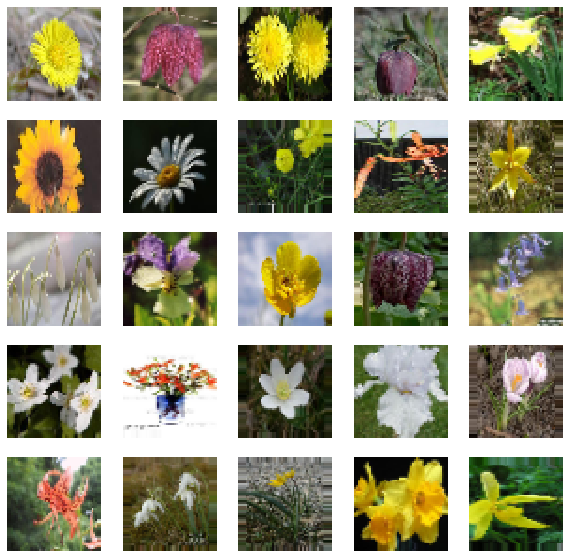

In [15]:
SAMPLE_SIZE = 1000

# generate training samples
X_train = []
for i in range(SAMPLE_SIZE):
  myimg = train_generator.next()
  X_train.append(np.array(myimg[0][0]))
  #plt.imshow(np.array(myimg[0][0]))
  #plt.show()

X_train = np.array(X_train)

# plot 25 images
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_train[i])

Epochs: 2000
Batch size: 128
Batches per epoch: 7
--------------- Epoch 1 ---------------
-

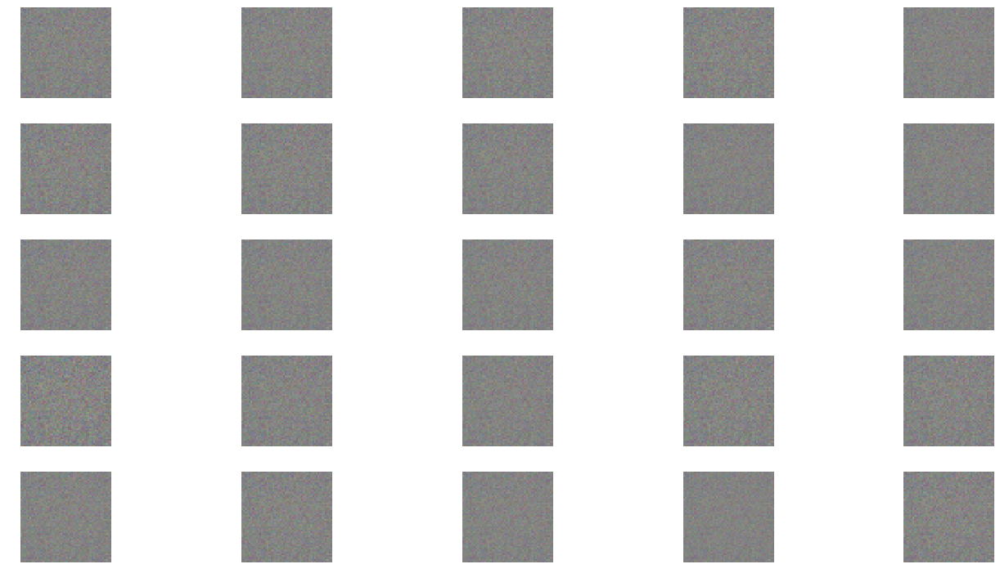

--------------- Epoch 2 ---------------
---------------- Epoch 3 ---------------
---------------- Epoch 4 ---------------
---------------- Epoch 5 ---------------
---------------- Epoch 6 ---------------
---------------- Epoch 7 ---------------
---------------- Epoch 8 ---------------
---------------- Epoch 9 ---------------
---------------- Epoch 10 ---------------
---------------- Epoch 11 ---------------
---------------- Epoch 12 ---------------
---------------- Epoch 13 ---------------
---------------- Epoch 14 ---------------
---------------- Epoch 15 ---------------
---------------- Epoch 16 ---------------
---------------- Epoch 17 ---------------
---------------- Epoch 18 ---------------
---------------- Epoch 19 ---------------
---------------- Epoch 20 ---------------
-

<Figure size 432x288 with 0 Axes>

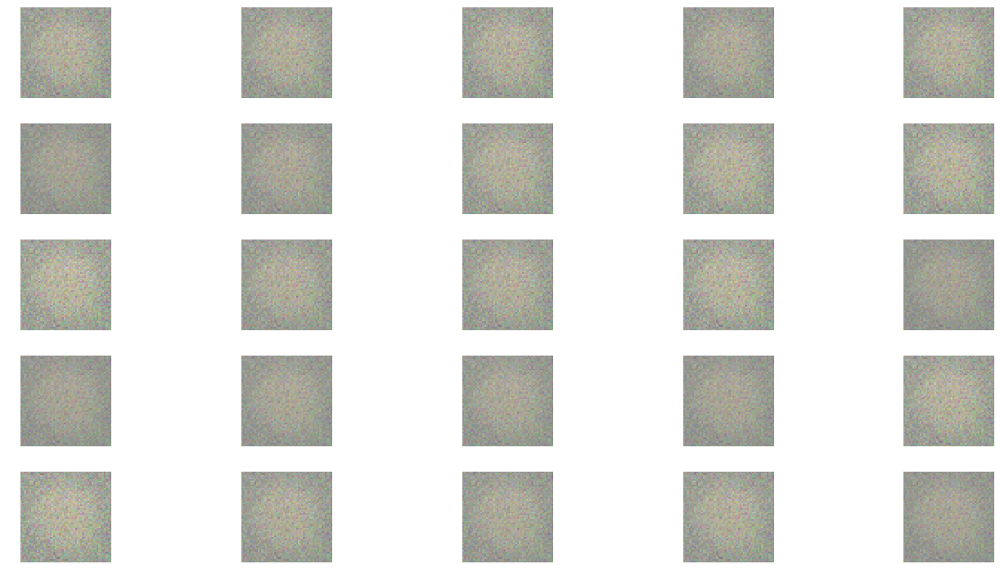

--------------- Epoch 21 ---------------
---------------- Epoch 22 ---------------
---------------- Epoch 23 ---------------
---------------- Epoch 24 ---------------
---------------- Epoch 25 ---------------
---------------- Epoch 26 ---------------
---------------- Epoch 27 ---------------
---------------- Epoch 28 ---------------
---------------- Epoch 29 ---------------
---------------- Epoch 30 ---------------
---------------- Epoch 31 ---------------
---------------- Epoch 32 ---------------
---------------- Epoch 33 ---------------
---------------- Epoch 34 ---------------
---------------- Epoch 35 ---------------
---------------- Epoch 36 ---------------
---------------- Epoch 37 ---------------
---------------- Epoch 38 ---------------
---------------- Epoch 39 ---------------
---------------- Epoch 40 ---------------
-

<Figure size 432x288 with 0 Axes>

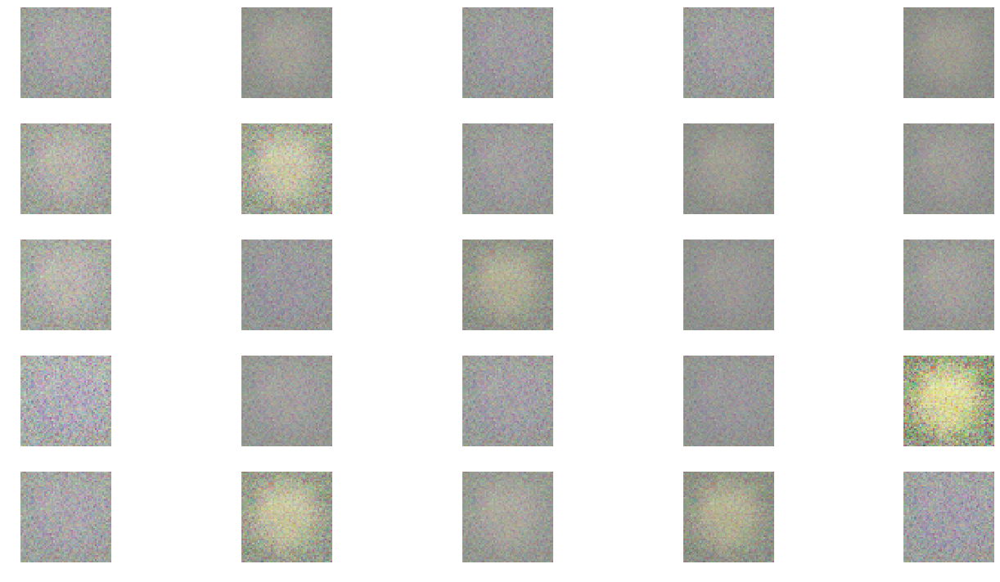

--------------- Epoch 41 ---------------
---------------- Epoch 42 ---------------
---------------- Epoch 43 ---------------
---------------- Epoch 44 ---------------
---------------- Epoch 45 ---------------
---------------- Epoch 46 ---------------
---------------- Epoch 47 ---------------
---------------- Epoch 48 ---------------
---------------- Epoch 49 ---------------
---------------- Epoch 50 ---------------
---------------- Epoch 51 ---------------
---------------- Epoch 52 ---------------
---------------- Epoch 53 ---------------
---------------- Epoch 54 ---------------
---------------- Epoch 55 ---------------
---------------- Epoch 56 ---------------
---------------- Epoch 57 ---------------
---------------- Epoch 58 ---------------
---------------- Epoch 59 ---------------
---------------- Epoch 60 ---------------
-

<Figure size 432x288 with 0 Axes>

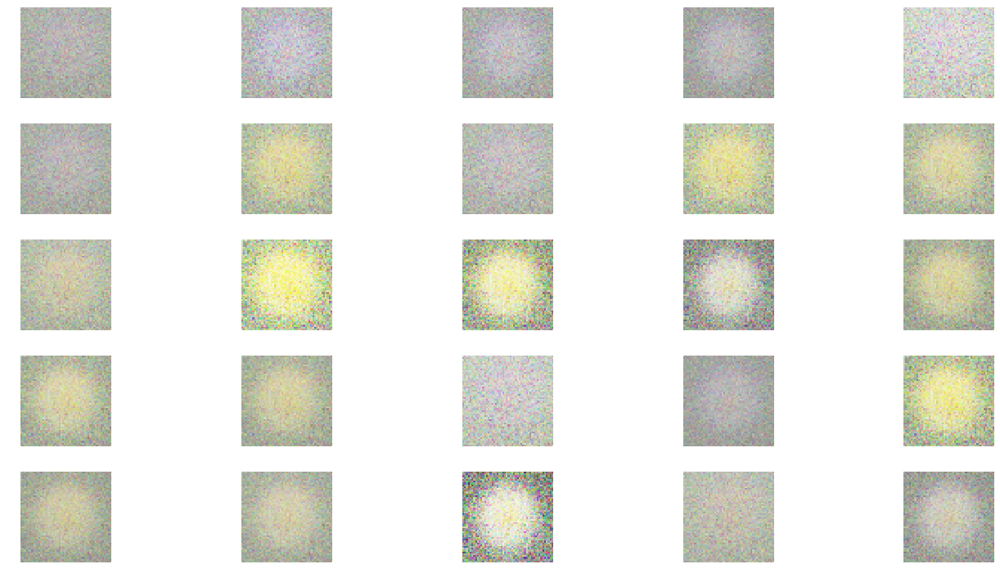

--------------- Epoch 61 ---------------
---------------- Epoch 62 ---------------
---------------- Epoch 63 ---------------
---------------- Epoch 64 ---------------
---------------- Epoch 65 ---------------
---------------- Epoch 66 ---------------
---------------- Epoch 67 ---------------
---------------- Epoch 68 ---------------
---------------- Epoch 69 ---------------
---------------- Epoch 70 ---------------
---------------- Epoch 71 ---------------
---------------- Epoch 72 ---------------
---------------- Epoch 73 ---------------
---------------- Epoch 74 ---------------
---------------- Epoch 75 ---------------
---------------- Epoch 76 ---------------
---------------- Epoch 77 ---------------
---------------- Epoch 78 ---------------
---------------- Epoch 79 ---------------
---------------- Epoch 80 ---------------
-

<Figure size 432x288 with 0 Axes>

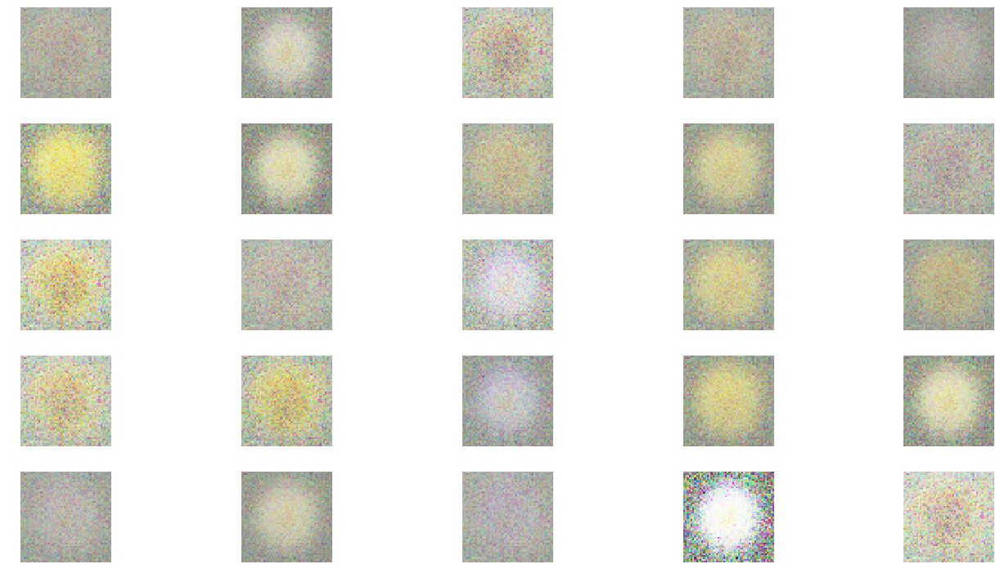

--------------- Epoch 81 ---------------
---------------- Epoch 82 ---------------
---------------- Epoch 83 ---------------
---------------- Epoch 84 ---------------
---------------- Epoch 85 ---------------
---------------- Epoch 86 ---------------
---------------- Epoch 87 ---------------
---------------- Epoch 88 ---------------
---------------- Epoch 89 ---------------
---------------- Epoch 90 ---------------
---------------- Epoch 91 ---------------
---------------- Epoch 92 ---------------
---------------- Epoch 93 ---------------
---------------- Epoch 94 ---------------
---------------- Epoch 95 ---------------
---------------- Epoch 96 ---------------
---------------- Epoch 97 ---------------
---------------- Epoch 98 ---------------
---------------- Epoch 99 ---------------
---------------- Epoch 100 ---------------
-

<Figure size 432x288 with 0 Axes>

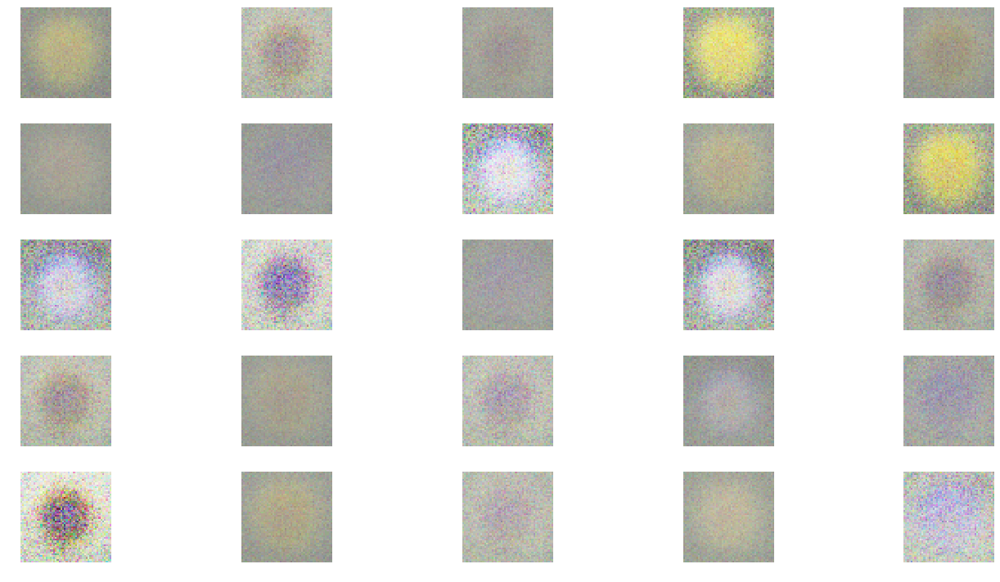

--------------- Epoch 101 ---------------
---------------- Epoch 102 ---------------
---------------- Epoch 103 ---------------
---------------- Epoch 104 ---------------
---------------- Epoch 105 ---------------
---------------- Epoch 106 ---------------
---------------- Epoch 107 ---------------
---------------- Epoch 108 ---------------
---------------- Epoch 109 ---------------
---------------- Epoch 110 ---------------
---------------- Epoch 111 ---------------
---------------- Epoch 112 ---------------
---------------- Epoch 113 ---------------
---------------- Epoch 114 ---------------
---------------- Epoch 115 ---------------
---------------- Epoch 116 ---------------
---------------- Epoch 117 ---------------
---------------- Epoch 118 ---------------
---------------- Epoch 119 ---------------
---------------- Epoch 120 ---------------
-

<Figure size 432x288 with 0 Axes>

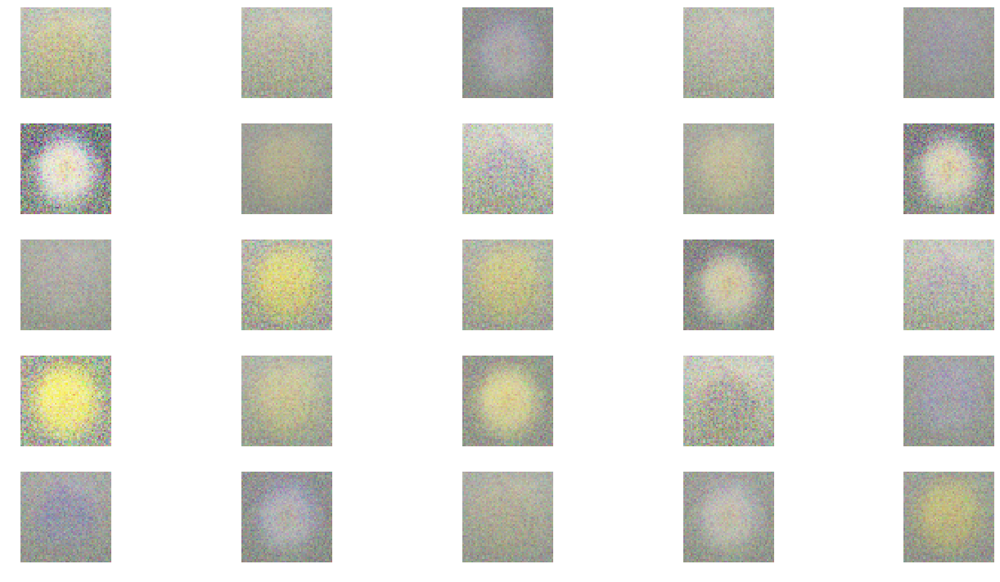

--------------- Epoch 121 ---------------
---------------- Epoch 122 ---------------
---------------- Epoch 123 ---------------
---------------- Epoch 124 ---------------
---------------- Epoch 125 ---------------
---------------- Epoch 126 ---------------
---------------- Epoch 127 ---------------
---------------- Epoch 128 ---------------
---------------- Epoch 129 ---------------
---------------- Epoch 130 ---------------
---------------- Epoch 131 ---------------
---------------- Epoch 132 ---------------
---------------- Epoch 133 ---------------
---------------- Epoch 134 ---------------
---------------- Epoch 135 ---------------
---------------- Epoch 136 ---------------
---------------- Epoch 137 ---------------
---------------- Epoch 138 ---------------
---------------- Epoch 139 ---------------
---------------- Epoch 140 ---------------
-

<Figure size 432x288 with 0 Axes>

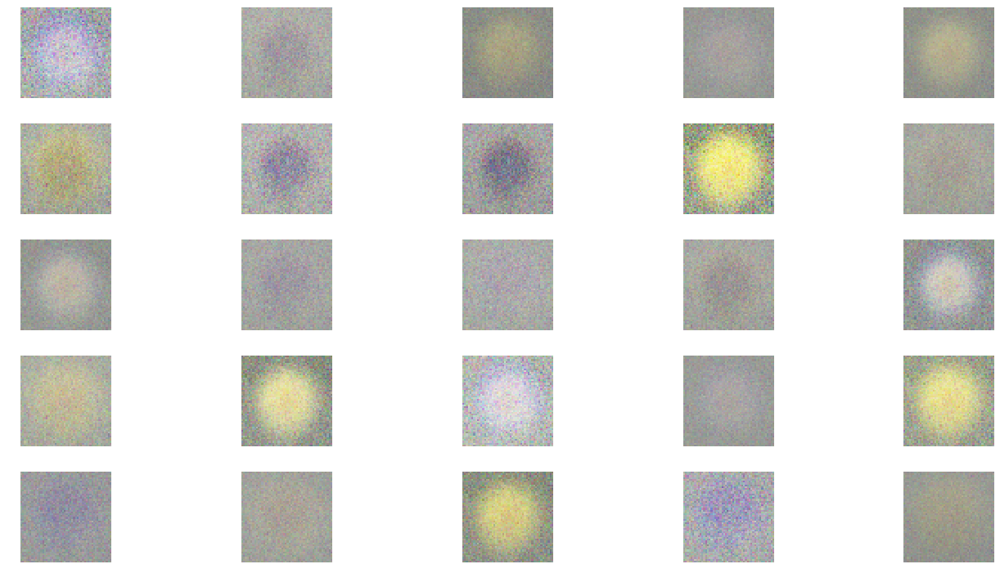

--------------- Epoch 141 ---------------
---------------- Epoch 142 ---------------
---------------- Epoch 143 ---------------
---------------- Epoch 144 ---------------
---------------- Epoch 145 ---------------
---------------- Epoch 146 ---------------
---------------- Epoch 147 ---------------
---------------- Epoch 148 ---------------
---------------- Epoch 149 ---------------
---------------- Epoch 150 ---------------
---------------- Epoch 151 ---------------
---------------- Epoch 152 ---------------
---------------- Epoch 153 ---------------
---------------- Epoch 154 ---------------
---------------- Epoch 155 ---------------
---------------- Epoch 156 ---------------
---------------- Epoch 157 ---------------
---------------- Epoch 158 ---------------
---------------- Epoch 159 ---------------
---------------- Epoch 160 ---------------
-

<Figure size 432x288 with 0 Axes>

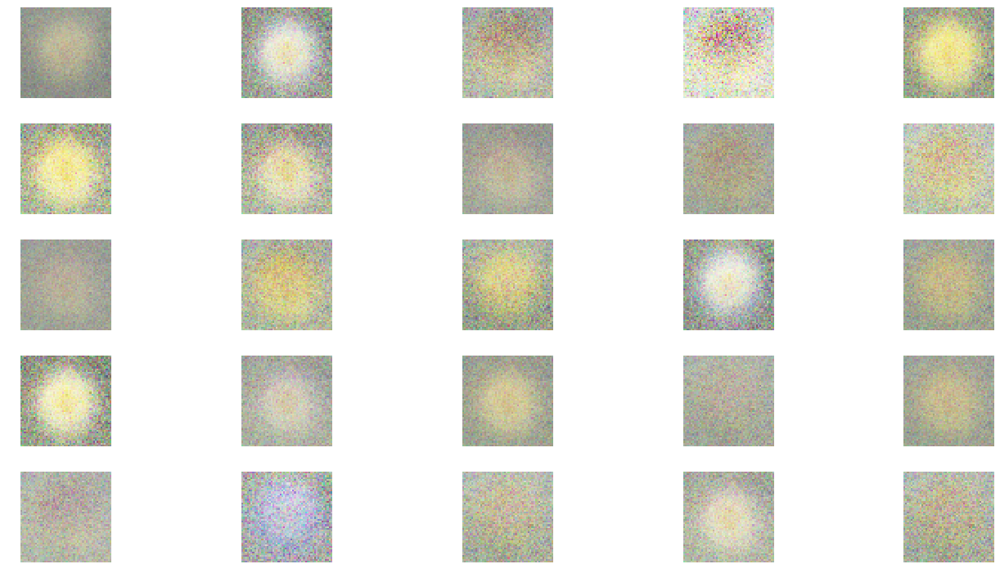

--------------- Epoch 161 ---------------
---------------- Epoch 162 ---------------
---------------- Epoch 163 ---------------
---------------- Epoch 164 ---------------
---------------- Epoch 165 ---------------
---------------- Epoch 166 ---------------
---------------- Epoch 167 ---------------
---------------- Epoch 168 ---------------
---------------- Epoch 169 ---------------
---------------- Epoch 170 ---------------
---------------- Epoch 171 ---------------
---------------- Epoch 172 ---------------
---------------- Epoch 173 ---------------
---------------- Epoch 174 ---------------
---------------- Epoch 175 ---------------
---------------- Epoch 176 ---------------
---------------- Epoch 177 ---------------
---------------- Epoch 178 ---------------
---------------- Epoch 179 ---------------
---------------- Epoch 180 ---------------
-

<Figure size 432x288 with 0 Axes>

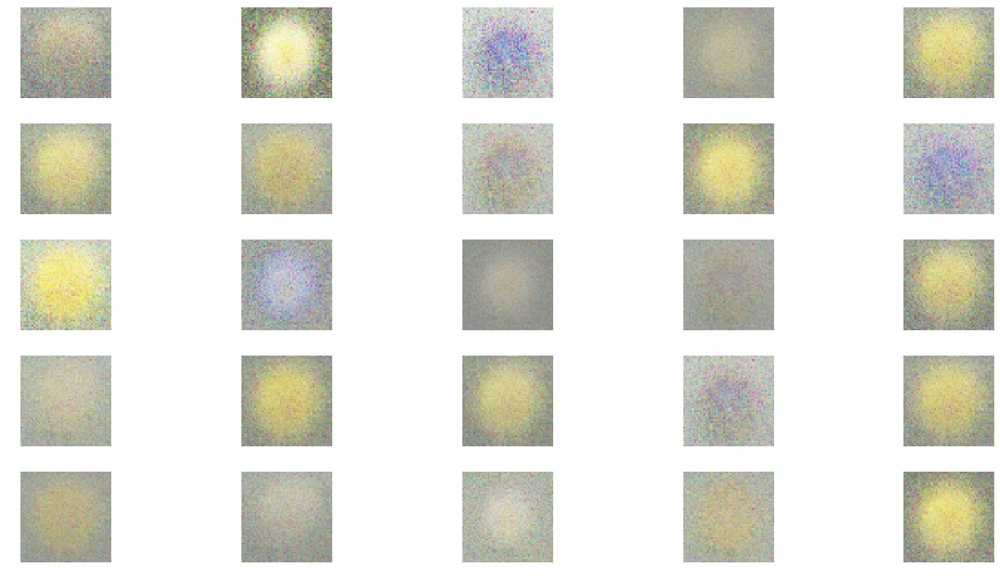

--------------- Epoch 181 ---------------
---------------- Epoch 182 ---------------
---------------- Epoch 183 ---------------
---------------- Epoch 184 ---------------
---------------- Epoch 185 ---------------
---------------- Epoch 186 ---------------
---------------- Epoch 187 ---------------
---------------- Epoch 188 ---------------
---------------- Epoch 189 ---------------
---------------- Epoch 190 ---------------
---------------- Epoch 191 ---------------
---------------- Epoch 192 ---------------
---------------- Epoch 193 ---------------
---------------- Epoch 194 ---------------
---------------- Epoch 195 ---------------
---------------- Epoch 196 ---------------
---------------- Epoch 197 ---------------
---------------- Epoch 198 ---------------
---------------- Epoch 199 ---------------
---------------- Epoch 200 ---------------
-

<Figure size 432x288 with 0 Axes>

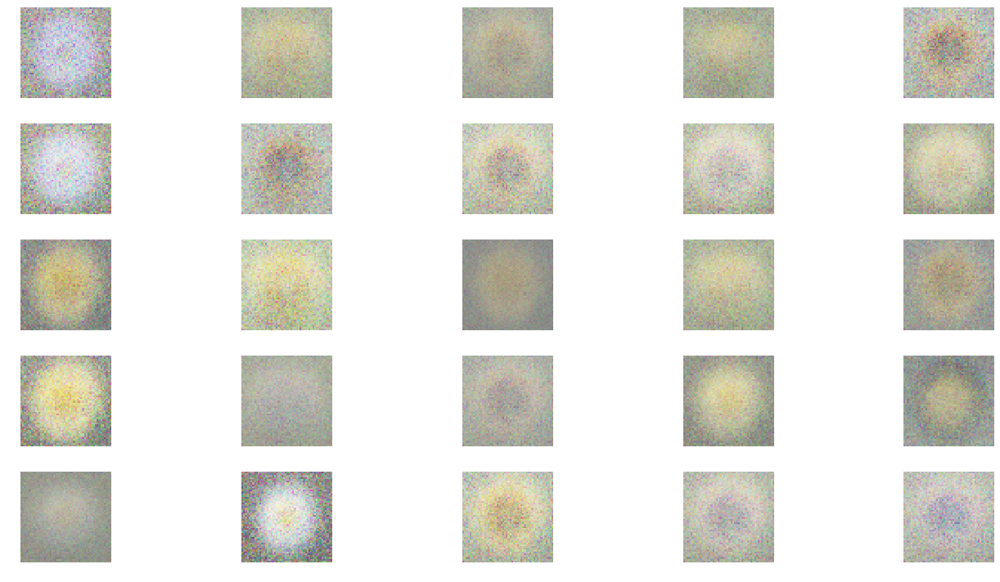

--------------- Epoch 201 ---------------
---------------- Epoch 202 ---------------
---------------- Epoch 203 ---------------
---------------- Epoch 204 ---------------
---------------- Epoch 205 ---------------
---------------- Epoch 206 ---------------
---------------- Epoch 207 ---------------
---------------- Epoch 208 ---------------
---------------- Epoch 209 ---------------
---------------- Epoch 210 ---------------
---------------- Epoch 211 ---------------
---------------- Epoch 212 ---------------
---------------- Epoch 213 ---------------
---------------- Epoch 214 ---------------
---------------- Epoch 215 ---------------
---------------- Epoch 216 ---------------
---------------- Epoch 217 ---------------
---------------- Epoch 218 ---------------
---------------- Epoch 219 ---------------
---------------- Epoch 220 ---------------
-

<Figure size 432x288 with 0 Axes>

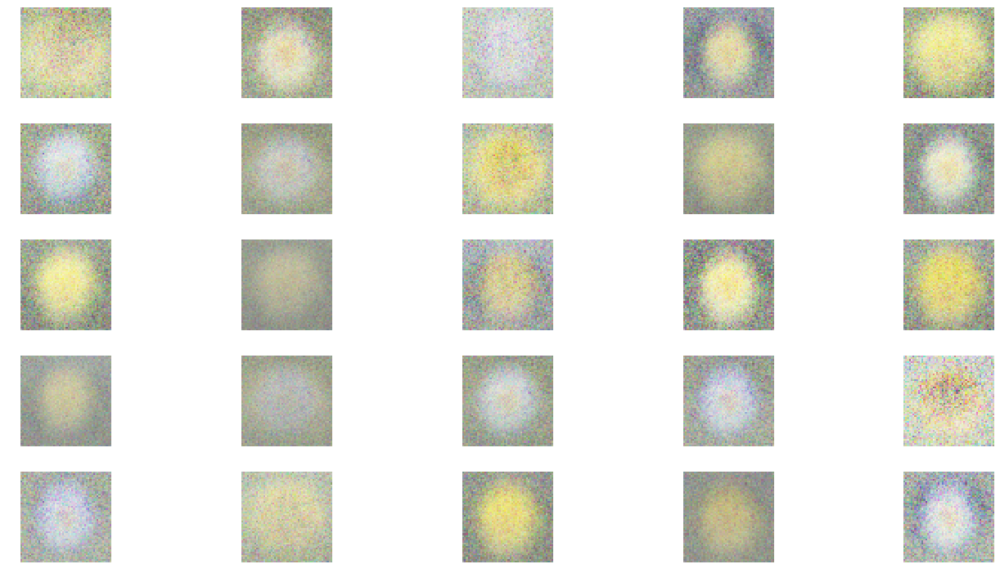

--------------- Epoch 221 ---------------
---------------- Epoch 222 ---------------
---------------- Epoch 223 ---------------
---------------- Epoch 224 ---------------
---------------- Epoch 225 ---------------
---------------- Epoch 226 ---------------
---------------- Epoch 227 ---------------
---------------- Epoch 228 ---------------
---------------- Epoch 229 ---------------
---------------- Epoch 230 ---------------
---------------- Epoch 231 ---------------
---------------- Epoch 232 ---------------
---------------- Epoch 233 ---------------
---------------- Epoch 234 ---------------
---------------- Epoch 235 ---------------
---------------- Epoch 236 ---------------
---------------- Epoch 237 ---------------
---------------- Epoch 238 ---------------
---------------- Epoch 239 ---------------
---------------- Epoch 240 ---------------
-

<Figure size 432x288 with 0 Axes>

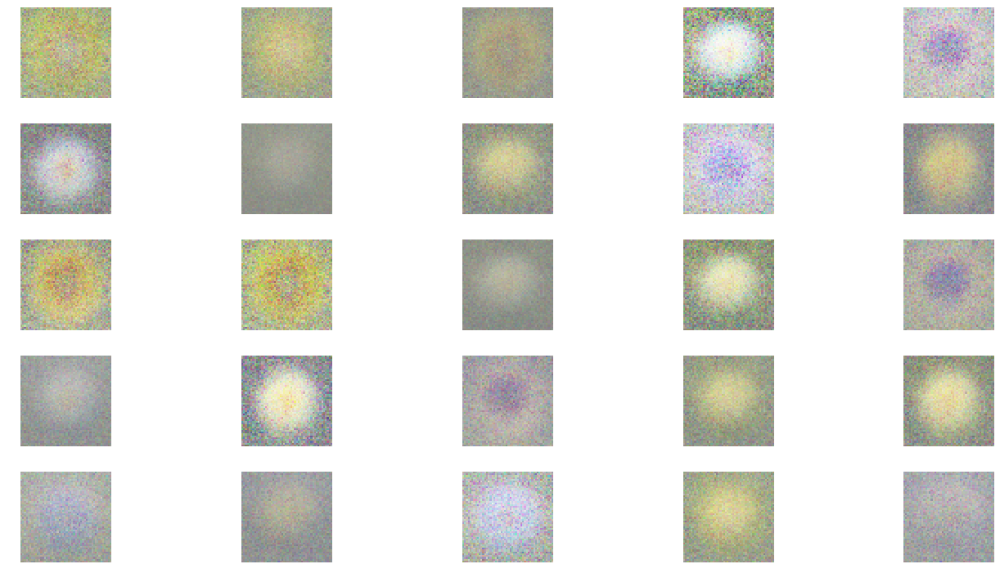

--------------- Epoch 241 ---------------
---------------- Epoch 242 ---------------
---------------- Epoch 243 ---------------
---------------- Epoch 244 ---------------
---------------- Epoch 245 ---------------
---------------- Epoch 246 ---------------
---------------- Epoch 247 ---------------
---------------- Epoch 248 ---------------
---------------- Epoch 249 ---------------
---------------- Epoch 250 ---------------
---------------- Epoch 251 ---------------
---------------- Epoch 252 ---------------
---------------- Epoch 253 ---------------
---------------- Epoch 254 ---------------
---------------- Epoch 255 ---------------
---------------- Epoch 256 ---------------
---------------- Epoch 257 ---------------
---------------- Epoch 258 ---------------
---------------- Epoch 259 ---------------
---------------- Epoch 260 ---------------
-

<Figure size 432x288 with 0 Axes>

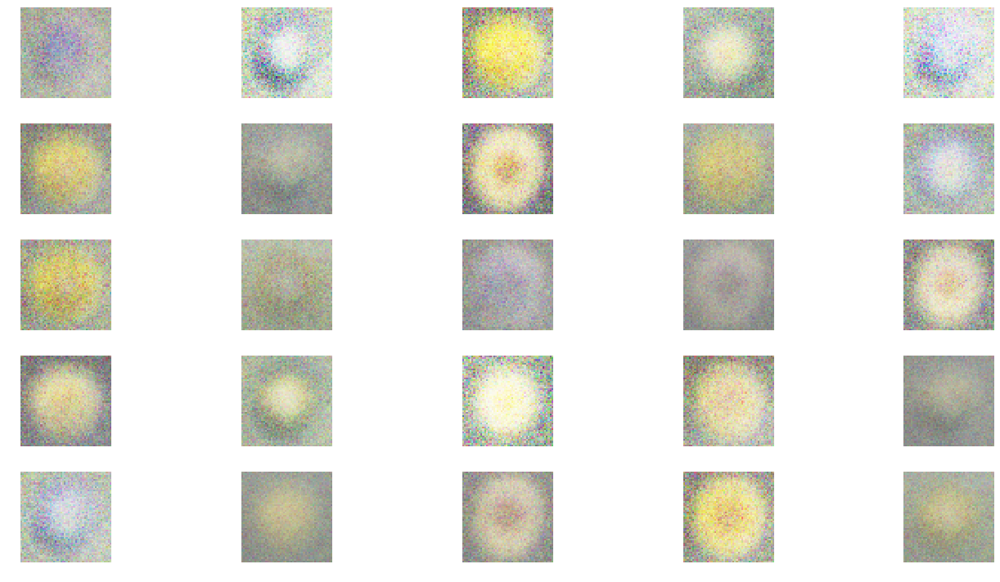

--------------- Epoch 261 ---------------
---------------- Epoch 262 ---------------
---------------- Epoch 263 ---------------
---------------- Epoch 264 ---------------
---------------- Epoch 265 ---------------
---------------- Epoch 266 ---------------
---------------- Epoch 267 ---------------
---------------- Epoch 268 ---------------
---------------- Epoch 269 ---------------
---------------- Epoch 270 ---------------
---------------- Epoch 271 ---------------
---------------- Epoch 272 ---------------
---------------- Epoch 273 ---------------
---------------- Epoch 274 ---------------
---------------- Epoch 275 ---------------
---------------- Epoch 276 ---------------
---------------- Epoch 277 ---------------
---------------- Epoch 278 ---------------
---------------- Epoch 279 ---------------
---------------- Epoch 280 ---------------
-

<Figure size 432x288 with 0 Axes>

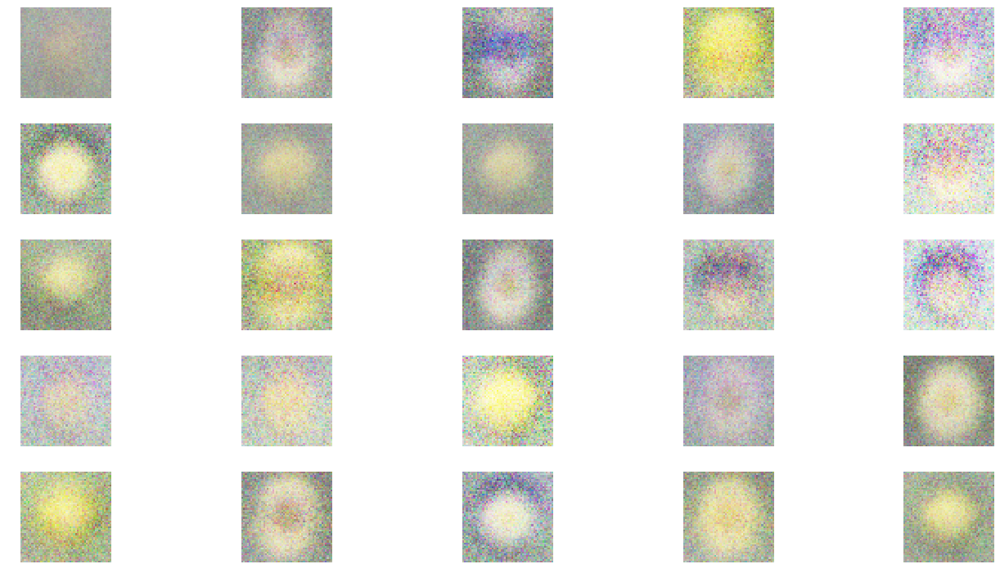

--------------- Epoch 281 ---------------
---------------- Epoch 282 ---------------
---------------- Epoch 283 ---------------
---------------- Epoch 284 ---------------
---------------- Epoch 285 ---------------
---------------- Epoch 286 ---------------
---------------- Epoch 287 ---------------
---------------- Epoch 288 ---------------
---------------- Epoch 289 ---------------
---------------- Epoch 290 ---------------
---------------- Epoch 291 ---------------
---------------- Epoch 292 ---------------
---------------- Epoch 293 ---------------
---------------- Epoch 294 ---------------
---------------- Epoch 295 ---------------
---------------- Epoch 296 ---------------
---------------- Epoch 297 ---------------
---------------- Epoch 298 ---------------
---------------- Epoch 299 ---------------
---------------- Epoch 300 ---------------
-

<Figure size 432x288 with 0 Axes>

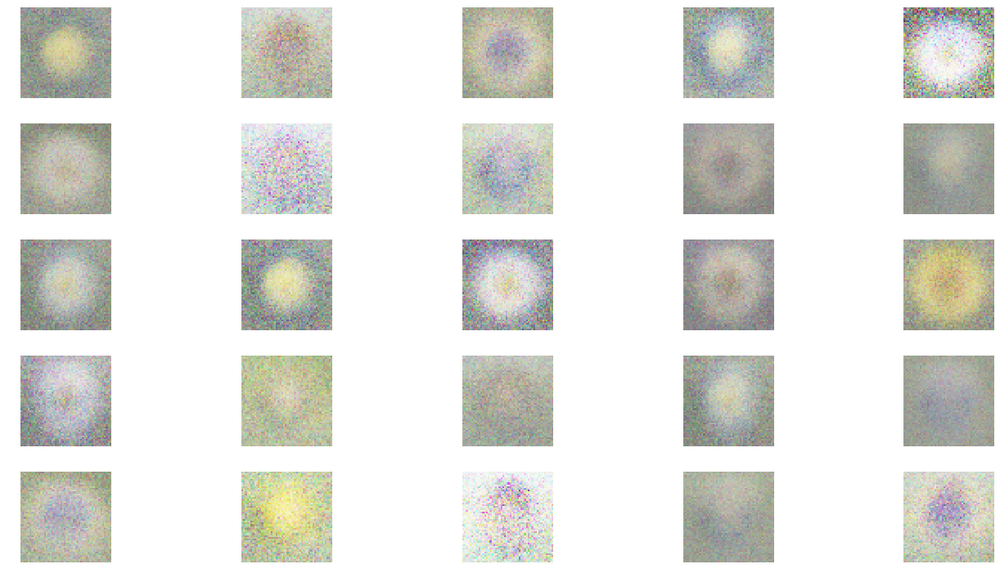

--------------- Epoch 301 ---------------
---------------- Epoch 302 ---------------
---------------- Epoch 303 ---------------
---------------- Epoch 304 ---------------
---------------- Epoch 305 ---------------
---------------- Epoch 306 ---------------
---------------- Epoch 307 ---------------
---------------- Epoch 308 ---------------
---------------- Epoch 309 ---------------
---------------- Epoch 310 ---------------
---------------- Epoch 311 ---------------
---------------- Epoch 312 ---------------
---------------- Epoch 313 ---------------
---------------- Epoch 314 ---------------
---------------- Epoch 315 ---------------
---------------- Epoch 316 ---------------
---------------- Epoch 317 ---------------
---------------- Epoch 318 ---------------
---------------- Epoch 319 ---------------
---------------- Epoch 320 ---------------
-

<Figure size 432x288 with 0 Axes>

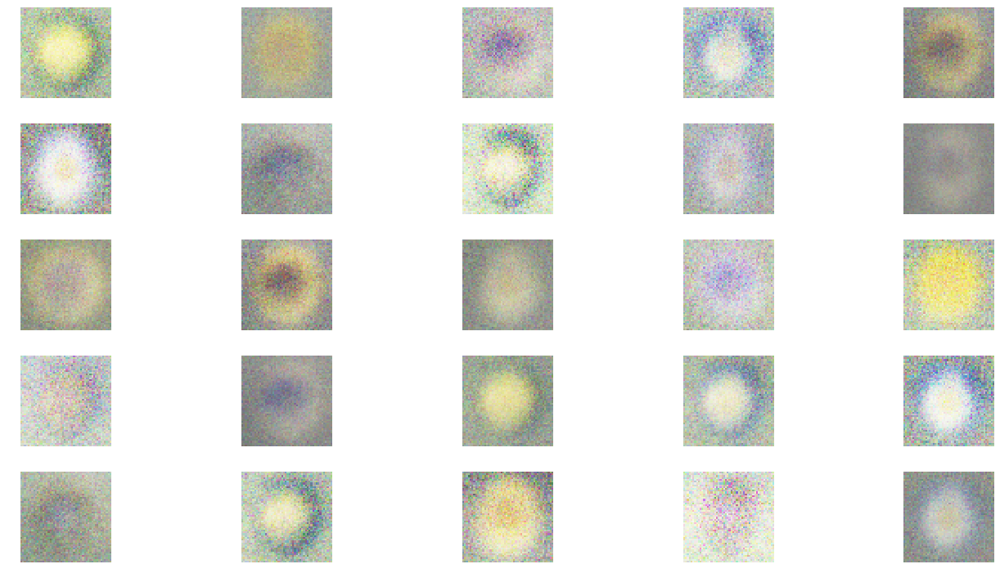

--------------- Epoch 321 ---------------
---------------- Epoch 322 ---------------
---------------- Epoch 323 ---------------
---------------- Epoch 324 ---------------
---------------- Epoch 325 ---------------
---------------- Epoch 326 ---------------
---------------- Epoch 327 ---------------
---------------- Epoch 328 ---------------
---------------- Epoch 329 ---------------
---------------- Epoch 330 ---------------
---------------- Epoch 331 ---------------
---------------- Epoch 332 ---------------
---------------- Epoch 333 ---------------
---------------- Epoch 334 ---------------
---------------- Epoch 335 ---------------
---------------- Epoch 336 ---------------
---------------- Epoch 337 ---------------
---------------- Epoch 338 ---------------
---------------- Epoch 339 ---------------
---------------- Epoch 340 ---------------
-

<Figure size 432x288 with 0 Axes>

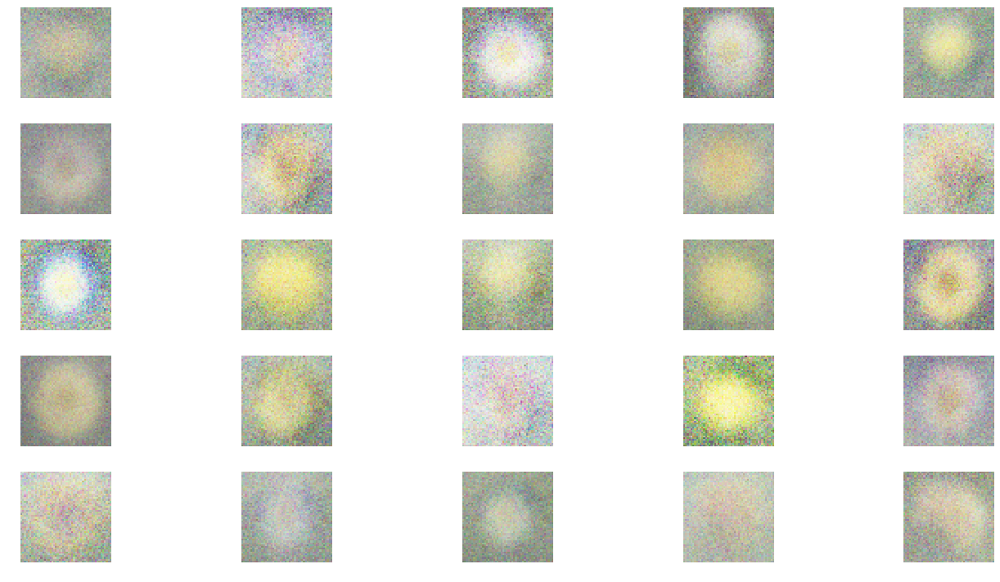

--------------- Epoch 341 ---------------
---------------- Epoch 342 ---------------
---------------- Epoch 343 ---------------
---------------- Epoch 344 ---------------
---------------- Epoch 345 ---------------
---------------- Epoch 346 ---------------
---------------- Epoch 347 ---------------
---------------- Epoch 348 ---------------
---------------- Epoch 349 ---------------
---------------- Epoch 350 ---------------
---------------- Epoch 351 ---------------
---------------- Epoch 352 ---------------
---------------- Epoch 353 ---------------
---------------- Epoch 354 ---------------
---------------- Epoch 355 ---------------
---------------- Epoch 356 ---------------
---------------- Epoch 357 ---------------
---------------- Epoch 358 ---------------
---------------- Epoch 359 ---------------
---------------- Epoch 360 ---------------
-

<Figure size 432x288 with 0 Axes>

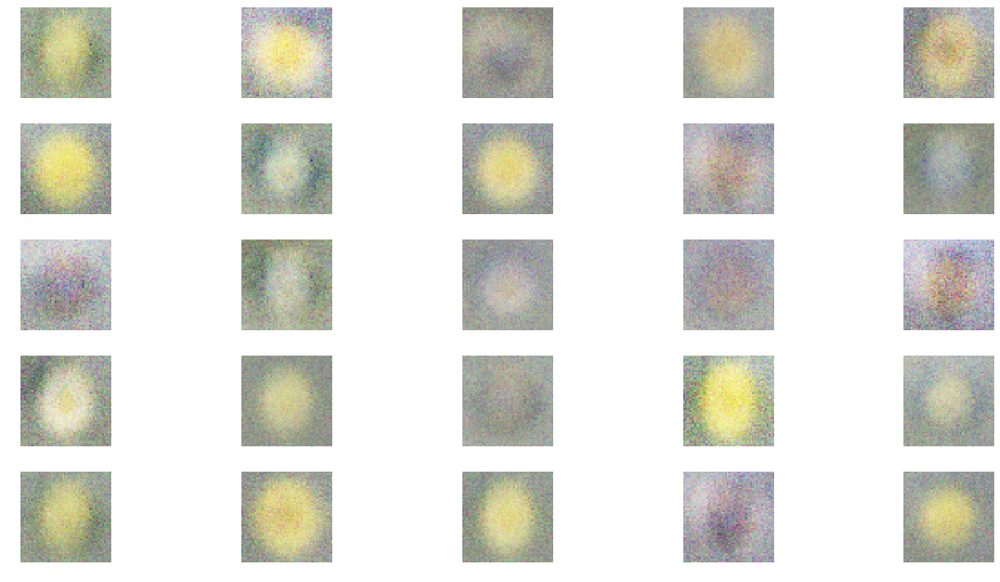

--------------- Epoch 361 ---------------
---------------- Epoch 362 ---------------
---------------- Epoch 363 ---------------
---------------- Epoch 364 ---------------
---------------- Epoch 365 ---------------
---------------- Epoch 366 ---------------
---------------- Epoch 367 ---------------
---------------- Epoch 368 ---------------
---------------- Epoch 369 ---------------
---------------- Epoch 370 ---------------
---------------- Epoch 371 ---------------
---------------- Epoch 372 ---------------
---------------- Epoch 373 ---------------
---------------- Epoch 374 ---------------
---------------- Epoch 375 ---------------
---------------- Epoch 376 ---------------
---------------- Epoch 377 ---------------
---------------- Epoch 378 ---------------
---------------- Epoch 379 ---------------
---------------- Epoch 380 ---------------
-

<Figure size 432x288 with 0 Axes>

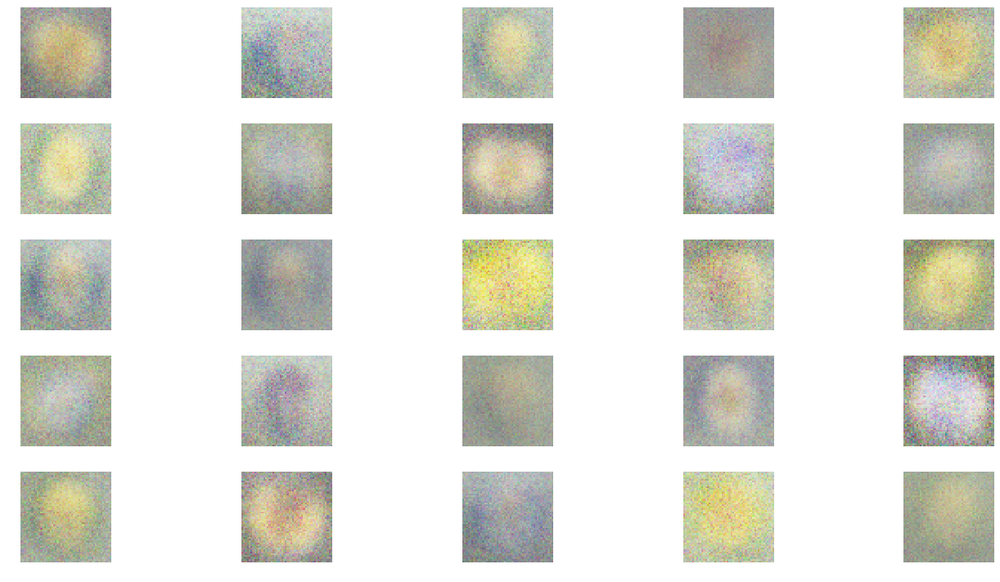

--------------- Epoch 381 ---------------
---------------- Epoch 382 ---------------
---------------- Epoch 383 ---------------
---------------- Epoch 384 ---------------
---------------- Epoch 385 ---------------
---------------- Epoch 386 ---------------
---------------- Epoch 387 ---------------
---------------- Epoch 388 ---------------
---------------- Epoch 389 ---------------
---------------- Epoch 390 ---------------
---------------- Epoch 391 ---------------
---------------- Epoch 392 ---------------
---------------- Epoch 393 ---------------
---------------- Epoch 394 ---------------
---------------- Epoch 395 ---------------
---------------- Epoch 396 ---------------
---------------- Epoch 397 ---------------
---------------- Epoch 398 ---------------
---------------- Epoch 399 ---------------
---------------- Epoch 400 ---------------
-

<Figure size 432x288 with 0 Axes>

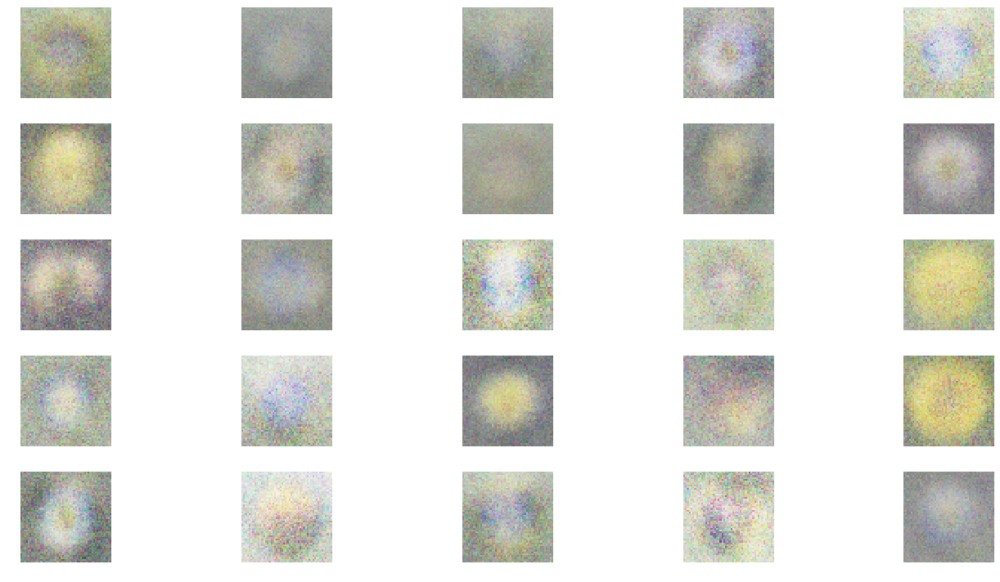

--------------- Epoch 401 ---------------
---------------- Epoch 402 ---------------
---------------- Epoch 403 ---------------
---------------- Epoch 404 ---------------
---------------- Epoch 405 ---------------
---------------- Epoch 406 ---------------
---------------- Epoch 407 ---------------
---------------- Epoch 408 ---------------
---------------- Epoch 409 ---------------
---------------- Epoch 410 ---------------
---------------- Epoch 411 ---------------
---------------- Epoch 412 ---------------
---------------- Epoch 413 ---------------
---------------- Epoch 414 ---------------
---------------- Epoch 415 ---------------
---------------- Epoch 416 ---------------
---------------- Epoch 417 ---------------
---------------- Epoch 418 ---------------
---------------- Epoch 419 ---------------
---------------- Epoch 420 ---------------
-

<Figure size 432x288 with 0 Axes>

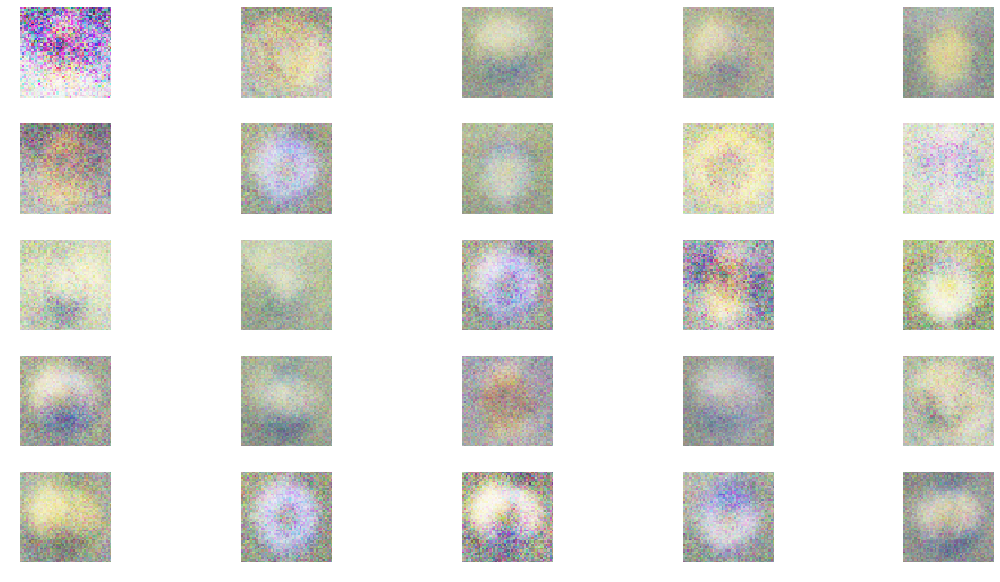

--------------- Epoch 421 ---------------
---------------- Epoch 422 ---------------
---------------- Epoch 423 ---------------
---------------- Epoch 424 ---------------
---------------- Epoch 425 ---------------
---------------- Epoch 426 ---------------
---------------- Epoch 427 ---------------
---------------- Epoch 428 ---------------
---------------- Epoch 429 ---------------
---------------- Epoch 430 ---------------
---------------- Epoch 431 ---------------
---------------- Epoch 432 ---------------
---------------- Epoch 433 ---------------
---------------- Epoch 434 ---------------
---------------- Epoch 435 ---------------
---------------- Epoch 436 ---------------
---------------- Epoch 437 ---------------
---------------- Epoch 438 ---------------
---------------- Epoch 439 ---------------
---------------- Epoch 440 ---------------
-

<Figure size 432x288 with 0 Axes>

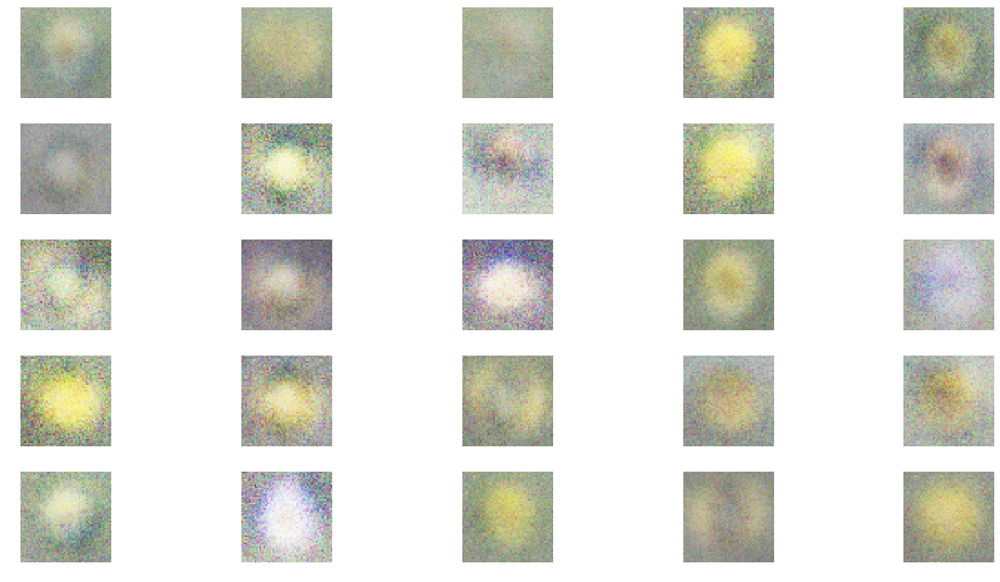

--------------- Epoch 441 ---------------
---------------- Epoch 442 ---------------
---------------- Epoch 443 ---------------
---------------- Epoch 444 ---------------
---------------- Epoch 445 ---------------
---------------- Epoch 446 ---------------
---------------- Epoch 447 ---------------
---------------- Epoch 448 ---------------
---------------- Epoch 449 ---------------
---------------- Epoch 450 ---------------
---------------- Epoch 451 ---------------
---------------- Epoch 452 ---------------
---------------- Epoch 453 ---------------
---------------- Epoch 454 ---------------
---------------- Epoch 455 ---------------
---------------- Epoch 456 ---------------
---------------- Epoch 457 ---------------
---------------- Epoch 458 ---------------
---------------- Epoch 459 ---------------
---------------- Epoch 460 ---------------
-

<Figure size 432x288 with 0 Axes>

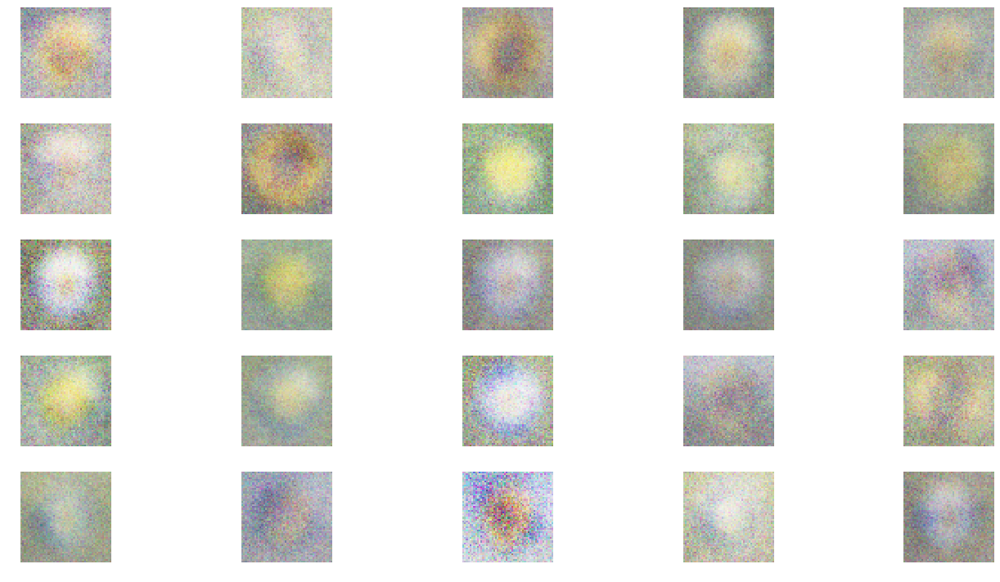

--------------- Epoch 461 ---------------
---------------- Epoch 462 ---------------
---------------- Epoch 463 ---------------
---------------- Epoch 464 ---------------
---------------- Epoch 465 ---------------
---------------- Epoch 466 ---------------
---------------- Epoch 467 ---------------
---------------- Epoch 468 ---------------
---------------- Epoch 469 ---------------
---------------- Epoch 470 ---------------
---------------- Epoch 471 ---------------
---------------- Epoch 472 ---------------
---------------- Epoch 473 ---------------
---------------- Epoch 474 ---------------
---------------- Epoch 475 ---------------
---------------- Epoch 476 ---------------
---------------- Epoch 477 ---------------
---------------- Epoch 478 ---------------
---------------- Epoch 479 ---------------
---------------- Epoch 480 ---------------
-

<Figure size 432x288 with 0 Axes>

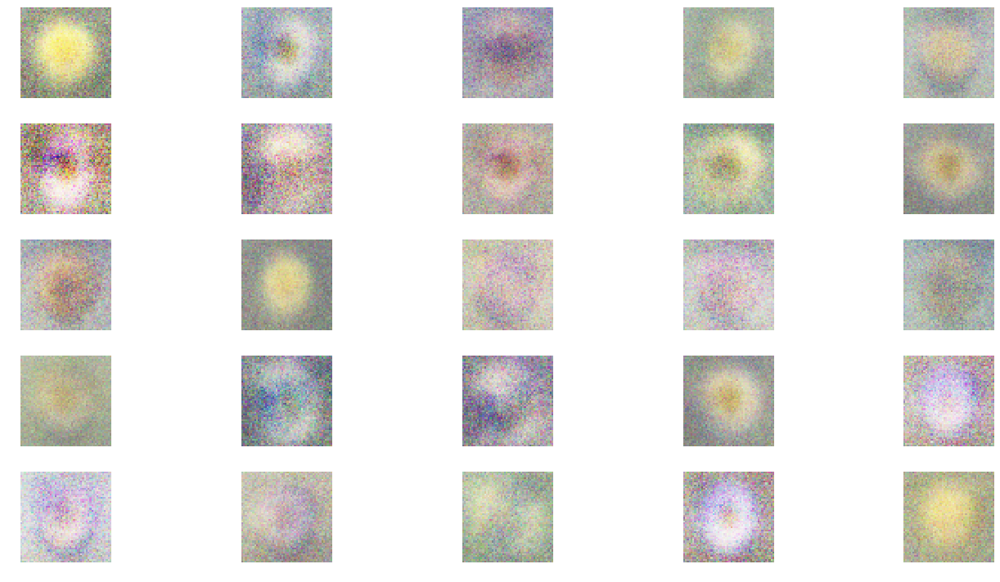

--------------- Epoch 481 ---------------
---------------- Epoch 482 ---------------
---------------- Epoch 483 ---------------
---------------- Epoch 484 ---------------
---------------- Epoch 485 ---------------
---------------- Epoch 486 ---------------
---------------- Epoch 487 ---------------
---------------- Epoch 488 ---------------
---------------- Epoch 489 ---------------
---------------- Epoch 490 ---------------
---------------- Epoch 491 ---------------
---------------- Epoch 492 ---------------
---------------- Epoch 493 ---------------
---------------- Epoch 494 ---------------
---------------- Epoch 495 ---------------
---------------- Epoch 496 ---------------
---------------- Epoch 497 ---------------
---------------- Epoch 498 ---------------
---------------- Epoch 499 ---------------
---------------- Epoch 500 ---------------
-

<Figure size 432x288 with 0 Axes>

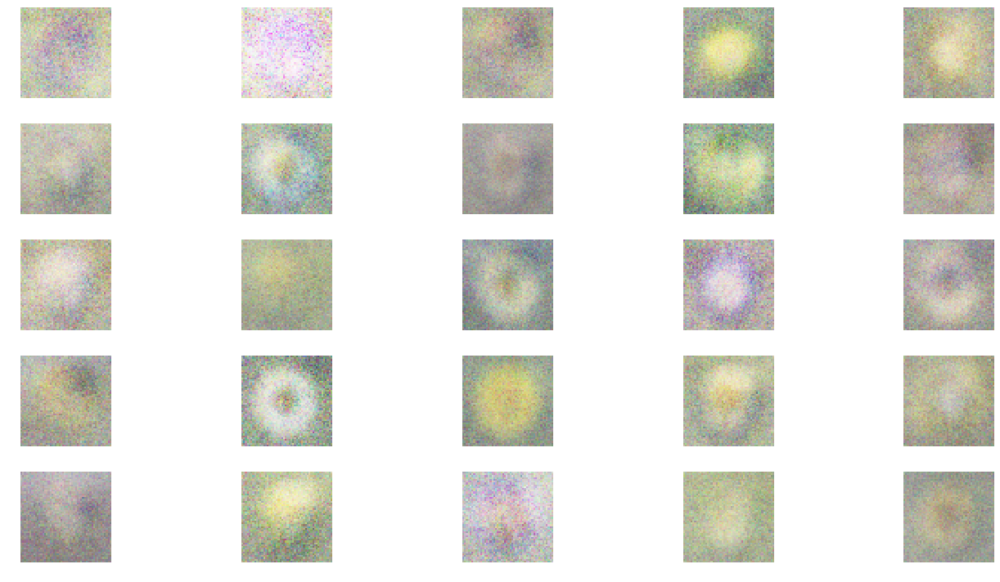

--------------- Epoch 501 ---------------
---------------- Epoch 502 ---------------
---------------- Epoch 503 ---------------
---------------- Epoch 504 ---------------
---------------- Epoch 505 ---------------
---------------- Epoch 506 ---------------
---------------- Epoch 507 ---------------
---------------- Epoch 508 ---------------
---------------- Epoch 509 ---------------
---------------- Epoch 510 ---------------
---------------- Epoch 511 ---------------
---------------- Epoch 512 ---------------
---------------- Epoch 513 ---------------
---------------- Epoch 514 ---------------
---------------- Epoch 515 ---------------
---------------- Epoch 516 ---------------
---------------- Epoch 517 ---------------
---------------- Epoch 518 ---------------
---------------- Epoch 519 ---------------
---------------- Epoch 520 ---------------
-

<Figure size 432x288 with 0 Axes>

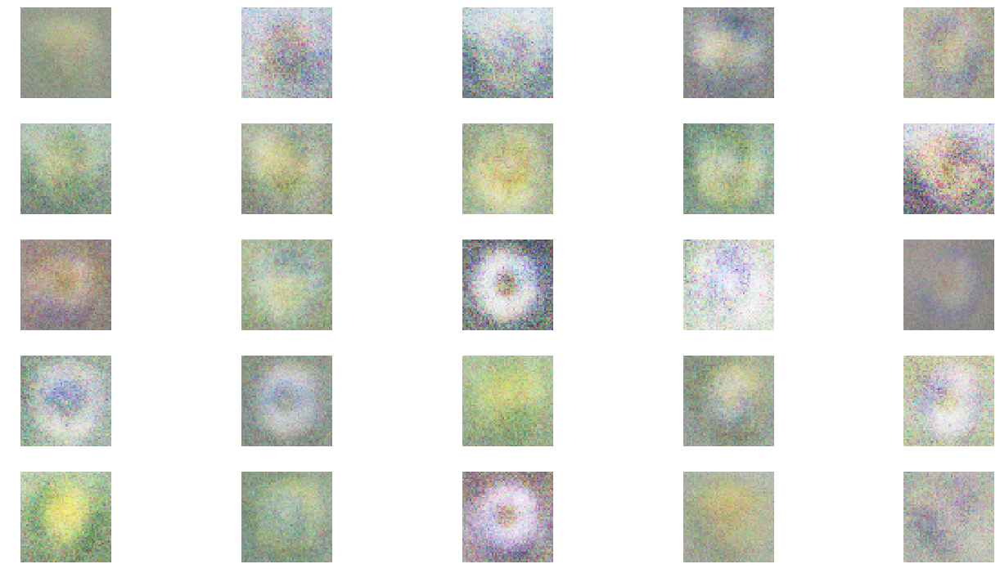

--------------- Epoch 521 ---------------
---------------- Epoch 522 ---------------
---------------- Epoch 523 ---------------
---------------- Epoch 524 ---------------
---------------- Epoch 525 ---------------
---------------- Epoch 526 ---------------
---------------- Epoch 527 ---------------
---------------- Epoch 528 ---------------
---------------- Epoch 529 ---------------
---------------- Epoch 530 ---------------
---------------- Epoch 531 ---------------
---------------- Epoch 532 ---------------
---------------- Epoch 533 ---------------
---------------- Epoch 534 ---------------
---------------- Epoch 535 ---------------
---------------- Epoch 536 ---------------
---------------- Epoch 537 ---------------
---------------- Epoch 538 ---------------
---------------- Epoch 539 ---------------
---------------- Epoch 540 ---------------
-

<Figure size 432x288 with 0 Axes>

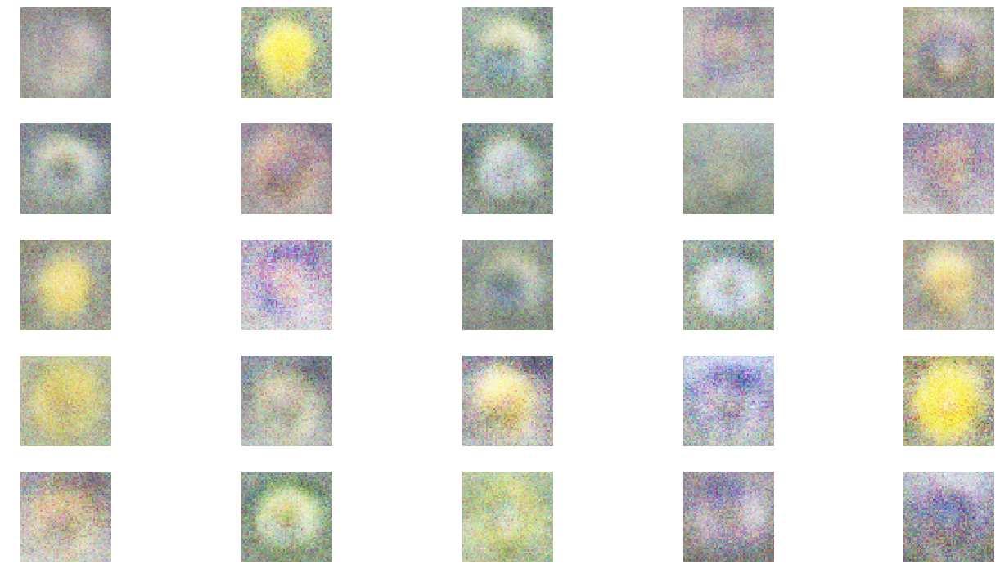

--------------- Epoch 541 ---------------
---------------- Epoch 542 ---------------
---------------- Epoch 543 ---------------
---------------- Epoch 544 ---------------
---------------- Epoch 545 ---------------
---------------- Epoch 546 ---------------
---------------- Epoch 547 ---------------
---------------- Epoch 548 ---------------
---------------- Epoch 549 ---------------
---------------- Epoch 550 ---------------
---------------- Epoch 551 ---------------
---------------- Epoch 552 ---------------
---------------- Epoch 553 ---------------
---------------- Epoch 554 ---------------
---------------- Epoch 555 ---------------
---------------- Epoch 556 ---------------
---------------- Epoch 557 ---------------
---------------- Epoch 558 ---------------
---------------- Epoch 559 ---------------
---------------- Epoch 560 ---------------
-

<Figure size 432x288 with 0 Axes>

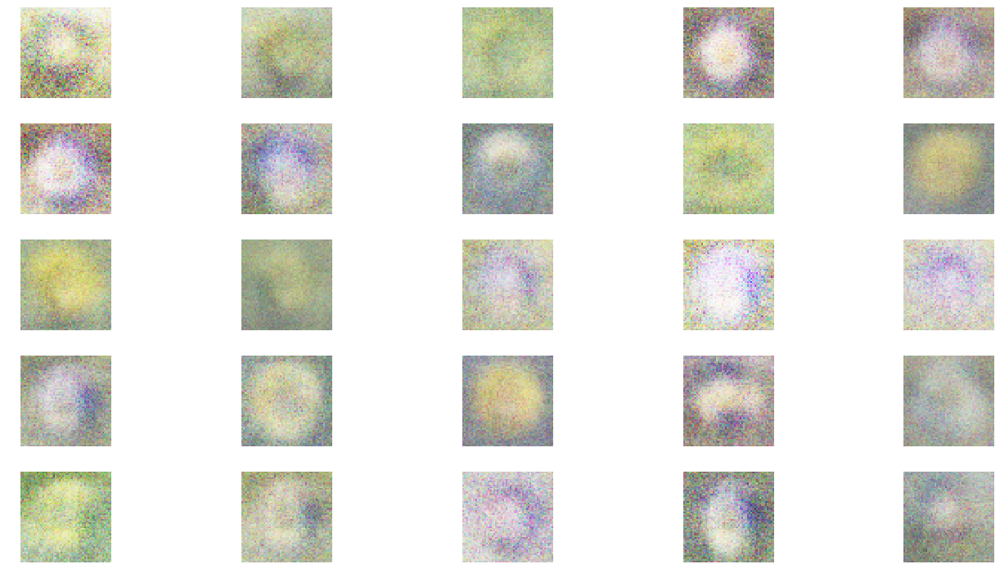

--------------- Epoch 561 ---------------
---------------- Epoch 562 ---------------
---------------- Epoch 563 ---------------
---------------- Epoch 564 ---------------
---------------- Epoch 565 ---------------
---------------- Epoch 566 ---------------
---------------- Epoch 567 ---------------
---------------- Epoch 568 ---------------
---------------- Epoch 569 ---------------
---------------- Epoch 570 ---------------
---------------- Epoch 571 ---------------
---------------- Epoch 572 ---------------
---------------- Epoch 573 ---------------
---------------- Epoch 574 ---------------
---------------- Epoch 575 ---------------
---------------- Epoch 576 ---------------
---------------- Epoch 577 ---------------
---------------- Epoch 578 ---------------
---------------- Epoch 579 ---------------
---------------- Epoch 580 ---------------
-

<Figure size 432x288 with 0 Axes>

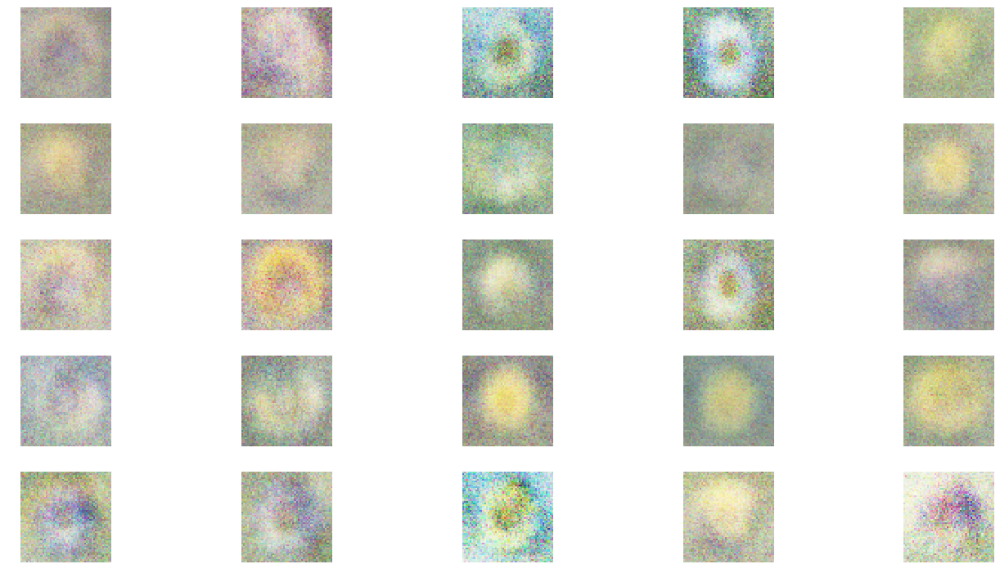

--------------- Epoch 581 ---------------
---------------- Epoch 582 ---------------
---------------- Epoch 583 ---------------
---------------- Epoch 584 ---------------
---------------- Epoch 585 ---------------
---------------- Epoch 586 ---------------
---------------- Epoch 587 ---------------
---------------- Epoch 588 ---------------
---------------- Epoch 589 ---------------
---------------- Epoch 590 ---------------
---------------- Epoch 591 ---------------
---------------- Epoch 592 ---------------
---------------- Epoch 593 ---------------
---------------- Epoch 594 ---------------
---------------- Epoch 595 ---------------
---------------- Epoch 596 ---------------
---------------- Epoch 597 ---------------
---------------- Epoch 598 ---------------
---------------- Epoch 599 ---------------
---------------- Epoch 600 ---------------
-

<Figure size 432x288 with 0 Axes>

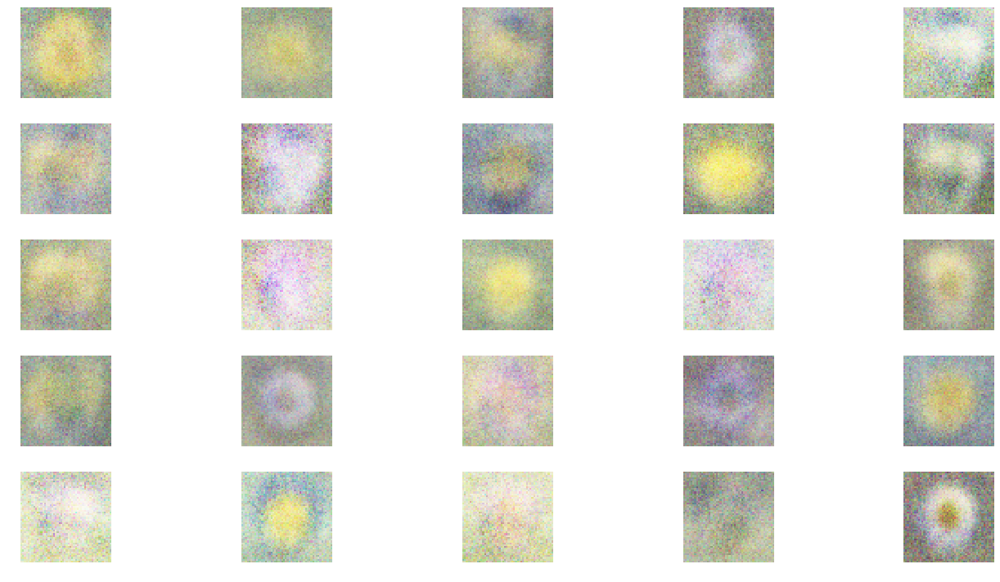

--------------- Epoch 601 ---------------
---------------- Epoch 602 ---------------
---------------- Epoch 603 ---------------
---------------- Epoch 604 ---------------
---------------- Epoch 605 ---------------
---------------- Epoch 606 ---------------
---------------- Epoch 607 ---------------
---------------- Epoch 608 ---------------
---------------- Epoch 609 ---------------
---------------- Epoch 610 ---------------
---------------- Epoch 611 ---------------
---------------- Epoch 612 ---------------
---------------- Epoch 613 ---------------
---------------- Epoch 614 ---------------
---------------- Epoch 615 ---------------
---------------- Epoch 616 ---------------
---------------- Epoch 617 ---------------
---------------- Epoch 618 ---------------
---------------- Epoch 619 ---------------
---------------- Epoch 620 ---------------
-

<Figure size 432x288 with 0 Axes>

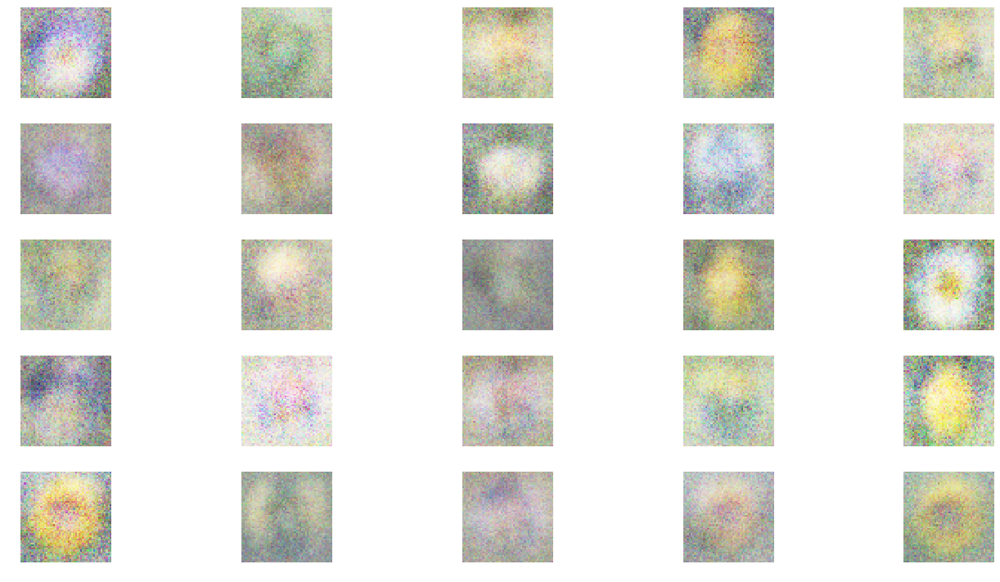

--------------- Epoch 621 ---------------
---------------- Epoch 622 ---------------
---------------- Epoch 623 ---------------
---------------- Epoch 624 ---------------
---------------- Epoch 625 ---------------
---------------- Epoch 626 ---------------
---------------- Epoch 627 ---------------
---------------- Epoch 628 ---------------
---------------- Epoch 629 ---------------
---------------- Epoch 630 ---------------
---------------- Epoch 631 ---------------
---------------- Epoch 632 ---------------
---------------- Epoch 633 ---------------
---------------- Epoch 634 ---------------
---------------- Epoch 635 ---------------
---------------- Epoch 636 ---------------
---------------- Epoch 637 ---------------
---------------- Epoch 638 ---------------
---------------- Epoch 639 ---------------
---------------- Epoch 640 ---------------
-

<Figure size 432x288 with 0 Axes>

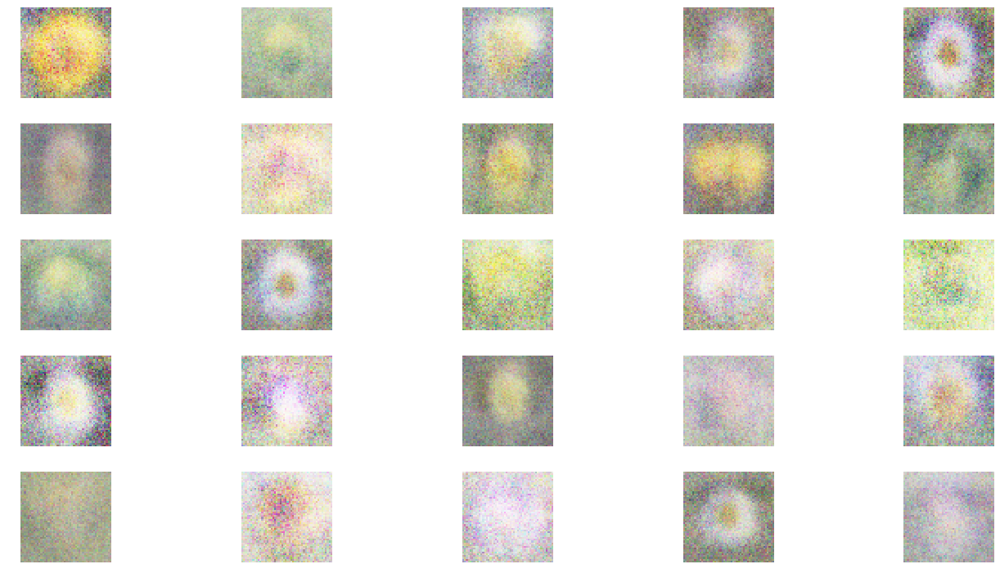

--------------- Epoch 641 ---------------
---------------- Epoch 642 ---------------
---------------- Epoch 643 ---------------
---------------- Epoch 644 ---------------
---------------- Epoch 645 ---------------
---------------- Epoch 646 ---------------
---------------- Epoch 647 ---------------
---------------- Epoch 648 ---------------
---------------- Epoch 649 ---------------
---------------- Epoch 650 ---------------
---------------- Epoch 651 ---------------
---------------- Epoch 652 ---------------
---------------- Epoch 653 ---------------
---------------- Epoch 654 ---------------
---------------- Epoch 655 ---------------
---------------- Epoch 656 ---------------
---------------- Epoch 657 ---------------
---------------- Epoch 658 ---------------
---------------- Epoch 659 ---------------
---------------- Epoch 660 ---------------
-

<Figure size 432x288 with 0 Axes>

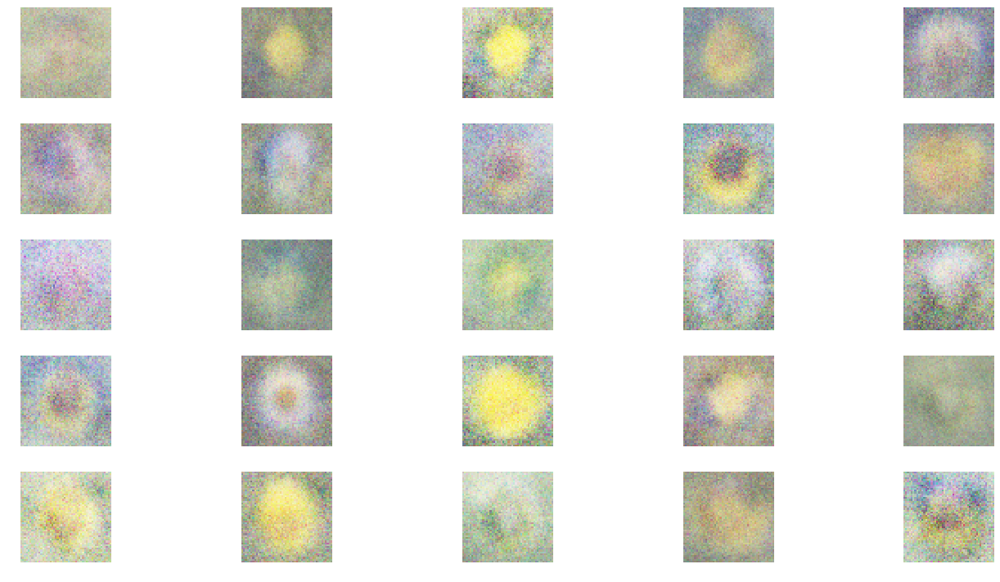

--------------- Epoch 661 ---------------
---------------- Epoch 662 ---------------
---------------- Epoch 663 ---------------
---------------- Epoch 664 ---------------
---------------- Epoch 665 ---------------
---------------- Epoch 666 ---------------
---------------- Epoch 667 ---------------
---------------- Epoch 668 ---------------
---------------- Epoch 669 ---------------
---------------- Epoch 670 ---------------
---------------- Epoch 671 ---------------
---------------- Epoch 672 ---------------
---------------- Epoch 673 ---------------
---------------- Epoch 674 ---------------
---------------- Epoch 675 ---------------
---------------- Epoch 676 ---------------
---------------- Epoch 677 ---------------
---------------- Epoch 678 ---------------
---------------- Epoch 679 ---------------
---------------- Epoch 680 ---------------
-

<Figure size 432x288 with 0 Axes>

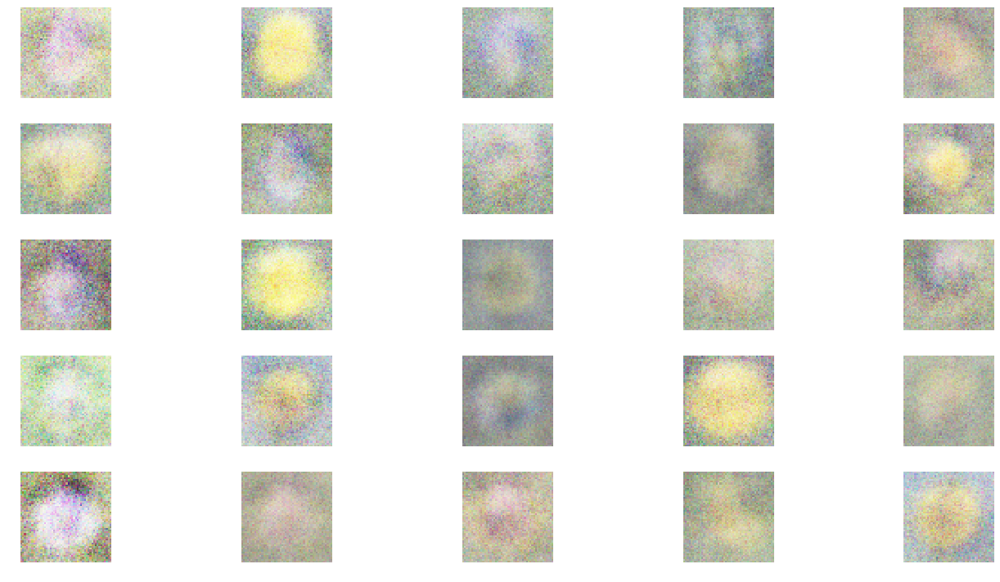

--------------- Epoch 681 ---------------
---------------- Epoch 682 ---------------
---------------- Epoch 683 ---------------
---------------- Epoch 684 ---------------
---------------- Epoch 685 ---------------
---------------- Epoch 686 ---------------
---------------- Epoch 687 ---------------
---------------- Epoch 688 ---------------
---------------- Epoch 689 ---------------
---------------- Epoch 690 ---------------
---------------- Epoch 691 ---------------
---------------- Epoch 692 ---------------
---------------- Epoch 693 ---------------
---------------- Epoch 694 ---------------
---------------- Epoch 695 ---------------
---------------- Epoch 696 ---------------
---------------- Epoch 697 ---------------
---------------- Epoch 698 ---------------
---------------- Epoch 699 ---------------
---------------- Epoch 700 ---------------
-

<Figure size 432x288 with 0 Axes>

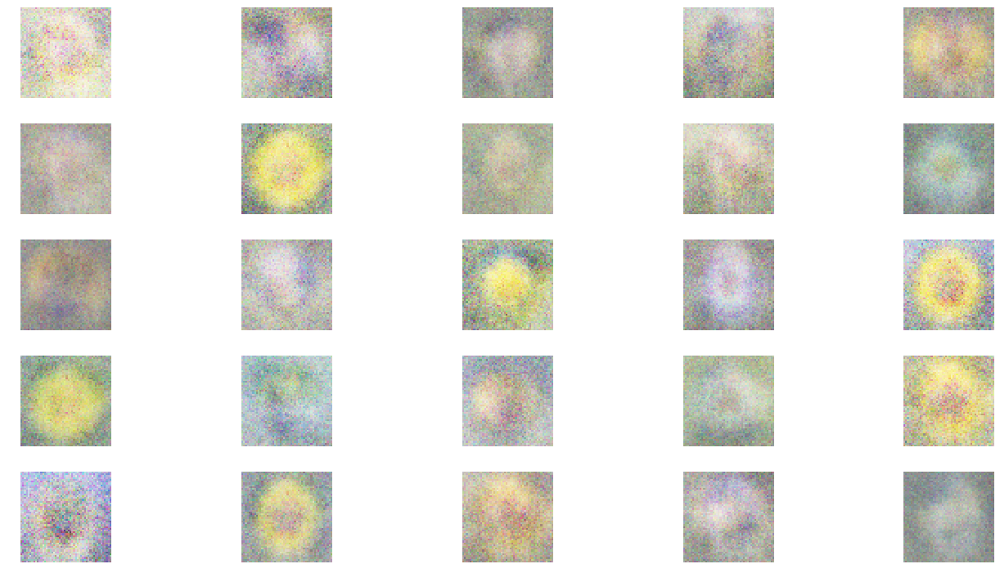

--------------- Epoch 701 ---------------
---------------- Epoch 702 ---------------
---------------- Epoch 703 ---------------
---------------- Epoch 704 ---------------
---------------- Epoch 705 ---------------
---------------- Epoch 706 ---------------
---------------- Epoch 707 ---------------
---------------- Epoch 708 ---------------
---------------- Epoch 709 ---------------
---------------- Epoch 710 ---------------
---------------- Epoch 711 ---------------
---------------- Epoch 712 ---------------
---------------- Epoch 713 ---------------
---------------- Epoch 714 ---------------
---------------- Epoch 715 ---------------
---------------- Epoch 716 ---------------
---------------- Epoch 717 ---------------
---------------- Epoch 718 ---------------
---------------- Epoch 719 ---------------
---------------- Epoch 720 ---------------
-

<Figure size 432x288 with 0 Axes>

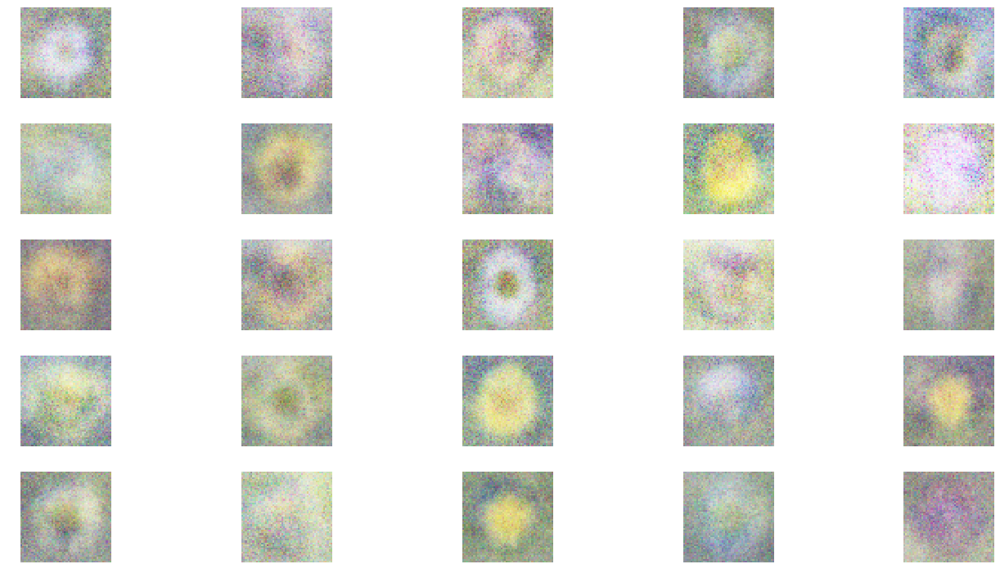

--------------- Epoch 721 ---------------
---------------- Epoch 722 ---------------
---------------- Epoch 723 ---------------
---------------- Epoch 724 ---------------
---------------- Epoch 725 ---------------
---------------- Epoch 726 ---------------
---------------- Epoch 727 ---------------
---------------- Epoch 728 ---------------
---------------- Epoch 729 ---------------
---------------- Epoch 730 ---------------
---------------- Epoch 731 ---------------
---------------- Epoch 732 ---------------
---------------- Epoch 733 ---------------
---------------- Epoch 734 ---------------
---------------- Epoch 735 ---------------
---------------- Epoch 736 ---------------
---------------- Epoch 737 ---------------
---------------- Epoch 738 ---------------
---------------- Epoch 739 ---------------
---------------- Epoch 740 ---------------
-

<Figure size 432x288 with 0 Axes>

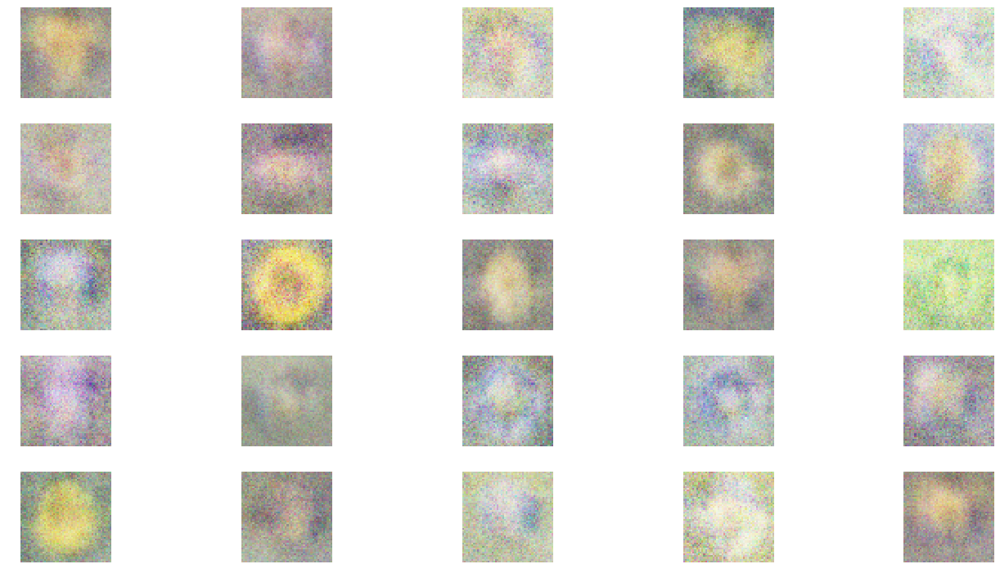

--------------- Epoch 741 ---------------
---------------- Epoch 742 ---------------
---------------- Epoch 743 ---------------
---------------- Epoch 744 ---------------
---------------- Epoch 745 ---------------
---------------- Epoch 746 ---------------
---------------- Epoch 747 ---------------
---------------- Epoch 748 ---------------
---------------- Epoch 749 ---------------
---------------- Epoch 750 ---------------
---------------- Epoch 751 ---------------
---------------- Epoch 752 ---------------
---------------- Epoch 753 ---------------
---------------- Epoch 754 ---------------
---------------- Epoch 755 ---------------
---------------- Epoch 756 ---------------
---------------- Epoch 757 ---------------
---------------- Epoch 758 ---------------
---------------- Epoch 759 ---------------
---------------- Epoch 760 ---------------
-

<Figure size 432x288 with 0 Axes>

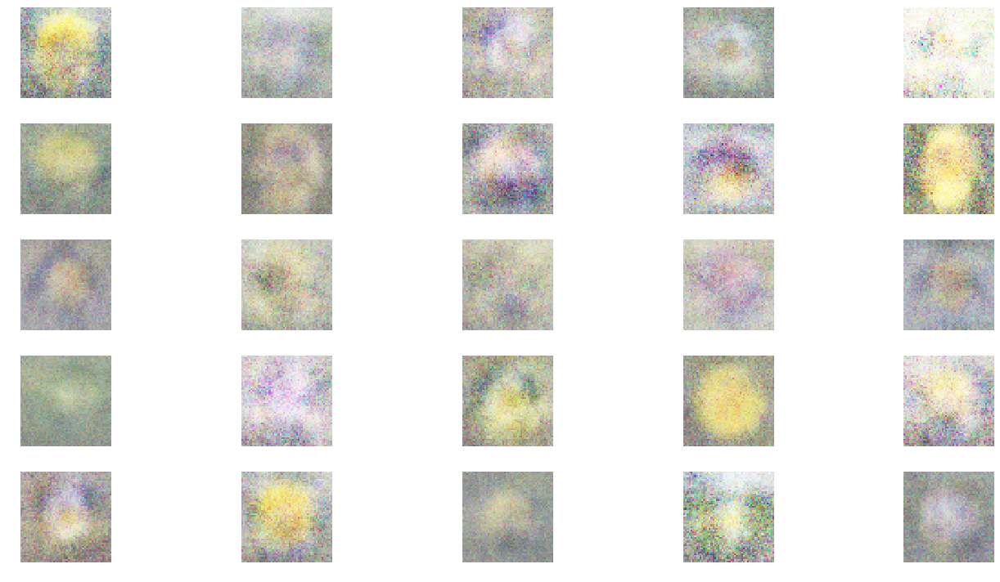

--------------- Epoch 761 ---------------
---------------- Epoch 762 ---------------
---------------- Epoch 763 ---------------
---------------- Epoch 764 ---------------
---------------- Epoch 765 ---------------
---------------- Epoch 766 ---------------
---------------- Epoch 767 ---------------
---------------- Epoch 768 ---------------
---------------- Epoch 769 ---------------
---------------- Epoch 770 ---------------
---------------- Epoch 771 ---------------
---------------- Epoch 772 ---------------
---------------- Epoch 773 ---------------
---------------- Epoch 774 ---------------
---------------- Epoch 775 ---------------
---------------- Epoch 776 ---------------
---------------- Epoch 777 ---------------
---------------- Epoch 778 ---------------
---------------- Epoch 779 ---------------
---------------- Epoch 780 ---------------
-

<Figure size 432x288 with 0 Axes>

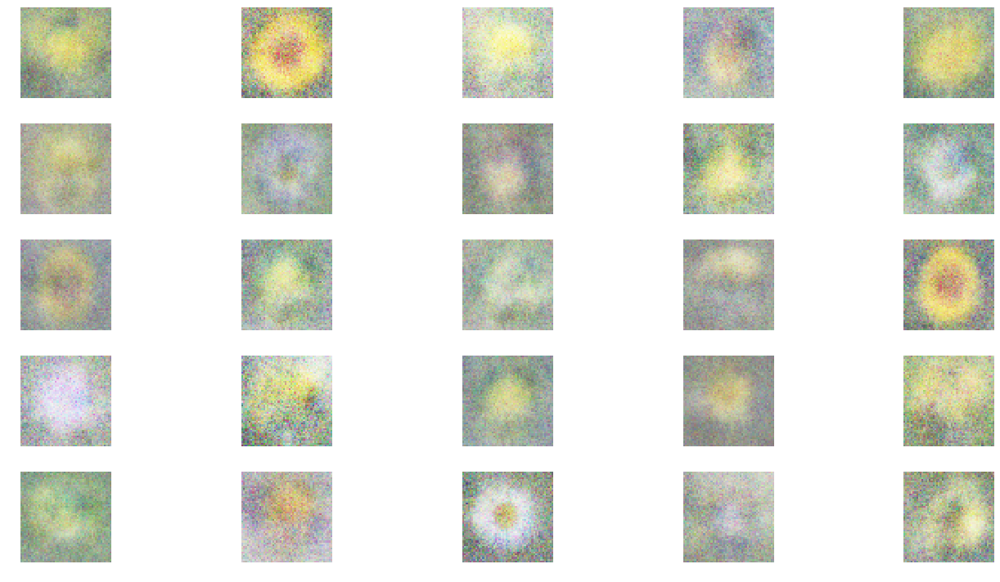

--------------- Epoch 781 ---------------
---------------- Epoch 782 ---------------
---------------- Epoch 783 ---------------
---------------- Epoch 784 ---------------
---------------- Epoch 785 ---------------
---------------- Epoch 786 ---------------
---------------- Epoch 787 ---------------
---------------- Epoch 788 ---------------
---------------- Epoch 789 ---------------
---------------- Epoch 790 ---------------
---------------- Epoch 791 ---------------
---------------- Epoch 792 ---------------
---------------- Epoch 793 ---------------
---------------- Epoch 794 ---------------
---------------- Epoch 795 ---------------
---------------- Epoch 796 ---------------
---------------- Epoch 797 ---------------
---------------- Epoch 798 ---------------
-

In [0]:
!mkdir images

dLosses = []
gLosses = []

# Plot the loss from each batch
def plotLoss(epoch):
    plt.figure(figsize=(10, 8))
    plt.plot(dLosses, label='Discriminitive loss')
    plt.plot(gLosses, label='Generative loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig('images/gan_loss_epoch_%d.png' % epoch)

# Create a wall of generated MNIST images
def plotGeneratedImages(epoch, examples=100, dim=(10, 10), figsize=(10, 10)):
    noise = np.random.normal(0, 1, size=[examples, randomDim])
    generatedImages = generator.predict(noise)
    generatedImages = generatedImages*127.5 + 127.5
    generatedImages = np.array(generatedImages, dtype=np.uint8)
    generatedImages = generatedImages.reshape(examples, IMG_SIZE[0], IMG_SIZE[1], 3)

    plt.figure(figsize=figsize)
    for i in range(generatedImages.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generatedImages[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    plt.savefig('images/gan_generated_image_epoch_%d.png' % epoch)

# Save the generator and discriminator networks (and weights) for later use
def saveModels(epoch):
    generator.save('models/gan_generator_epoch_%d.h5' % epoch)
    discriminator.save('models/gan_discriminator_epoch_%d.h5' % epoch)

def train(epochs=1, batchSize=128):
    batchCount = int(X_train.shape[0] / batchSize)
    print ('Epochs:', epochs)
    print ('Batch size:', batchSize)
    print ('Batches per epoch:', batchCount)

    for e in range(1, epochs+1):
        print ('-'*15, 'Epoch %d' % e, '-'*15)
        for idx in np.arange(0,batchCount):
            if idx%10 == 0:
              print('-', end='')
            
            # Get a random set of input noise and images
            noise = np.random.normal(0, 1, size=[batchSize, randomDim])
            imageBatch = X_train[np.random.randint(0, X_train.shape[0], size=batchSize)]
            # Generate fake MNIST images
            generatedImages = generator.predict(noise)
            #print (np.shape(imageBatch), np.shape(generatedImages))
            imageBatch = np.reshape(imageBatch,(batchSize, X_train.shape[1]*X_train.shape[2]*3))
            X = np.concatenate([imageBatch, generatedImages])

            # Labels for generated and real data
            yDis = np.zeros(2*batchSize)
            # One-sided label smoothing
            yDis[:batchSize] = 0.9

            # Train discriminator
            discriminator.trainable = True
            dloss = discriminator.train_on_batch(X, yDis)

            # Train generator
            noise = np.random.normal(0, 1, size=[batchSize, randomDim])
            yGen = np.ones(batchSize)
            discriminator.trainable = False
            gloss = gan.train_on_batch(noise, yGen)

        # Store loss of most recent batch from this epoch
        dLosses.append(dloss)
        gLosses.append(gloss)

        if e == 1 or e % 20 == 0:
            plotGeneratedImages(e, examples=25, dim=(5,5), figsize=(20,10))
            #saveModels(e)

    # Plot losses from every epoch
    plotLoss(e)
    
    
train(2000)